In [1]:
# Import packages
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Input, Concatenate, Attention, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from itertools import product
import tensorflow as tf

### Load Historical Dataset

In [2]:
df = pd.read_csv('historical_ywse_cleaned.csv')

### Feature Selection

In [3]:
# Drop non-numeric columns
df_non_categorical = df.drop(['year', 'state', 'crop', 'season'], axis=1)

X = df_non_categorical.drop('yield', axis=1) # features
y = df_non_categorical['yield'] # target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
selected_features = X.columns[lasso.coef_ != 0]
print("Selected features: ", selected_features)

Selected features:  Index(['Inflation annual %', 'Population', 'temperature_2m_min',
       'temperature_2m_max', 'precipitation_sum', 'Mean_N_SOIL', 'Mean_P_SOIL',
       'Mean_K_SOIL', 'Mean_TEMPERATURE', 'Mean_HUMIDITY'],
      dtype='object')


In [4]:
hist_df = df[['year', 'season', 'state', 'crop', 'yield', 'Inflation annual %', 'Population', 'temperature_2m_min',
       'temperature_2m_max', 'precipitation_sum', 'Mean_N_SOIL', 'Mean_P_SOIL',
       'Mean_K_SOIL', 'Mean_TEMPERATURE', 'Mean_HUMIDITY']]

### Load Forecast Dataset

In [5]:
future_df = pd.read_csv('future_ywse_cleaned.csv')
future_df = future_df[['year', 'season', 'state', 'crop', 'Inflation annual %', 'Population', 'temperature_2m_min',
       'temperature_2m_max', 'precipitation_sum', 'Mean_N_SOIL', 'Mean_P_SOIL',
       'Mean_K_SOIL', 'Mean_TEMPERATURE', 'Mean_HUMIDITY']]

### Running Ensemble on State Level

/var/folders/nx/_bvgjl1d7hg01rqvr_jylx_h0000gn/T/ipykernel_8526/665974352.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertibl

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7763  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4022 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5270 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7081
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4540 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6785 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3596 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5394 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3510 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5334
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4778  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3077
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4282
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4209
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2642
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2826
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4931
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3631 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4652 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3875  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3922
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3857
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3211
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3132
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4162
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3628
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3315
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3835
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3010  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2898
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2899
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2995
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2485
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2722
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2478
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2890
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3273
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8652  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9094
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0090
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7517 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7043  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4610 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5284 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3993
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5940
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6212 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5571
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4447
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3575 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4265
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0152  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9988
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2184
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9554
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9382
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9758
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7417
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7138
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7684
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6537  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9459
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5360
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8036
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8014
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6369
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7560
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6661
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5566
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8090
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 62.7353  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 60.2730
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 60.0264
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33.1688
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/st

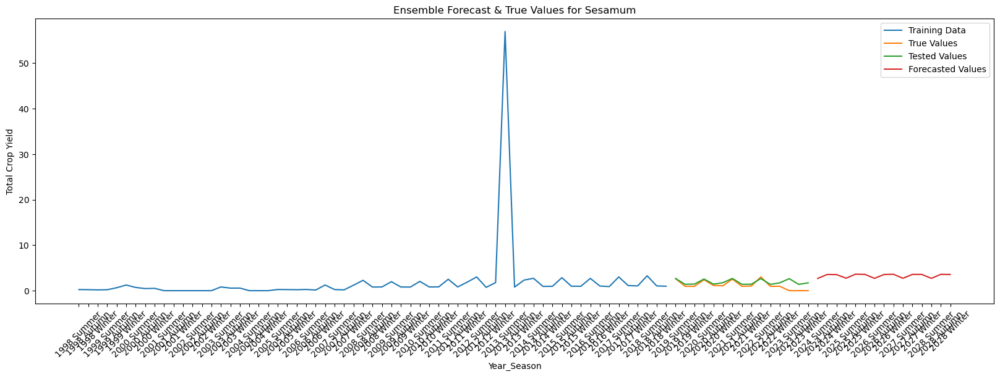

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5452  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5783
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4930
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6224
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5743
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4972
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3462
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3377
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3115
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.4884  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.0000
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.0799
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6126
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.2755 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.0359
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.4814 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9875
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3153
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.5205
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1843  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1884
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1116
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1745
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4838  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2702
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0478
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8154
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8198
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2718
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8096
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0384
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5913
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0354
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Dry Chillies: 4.30241747246464


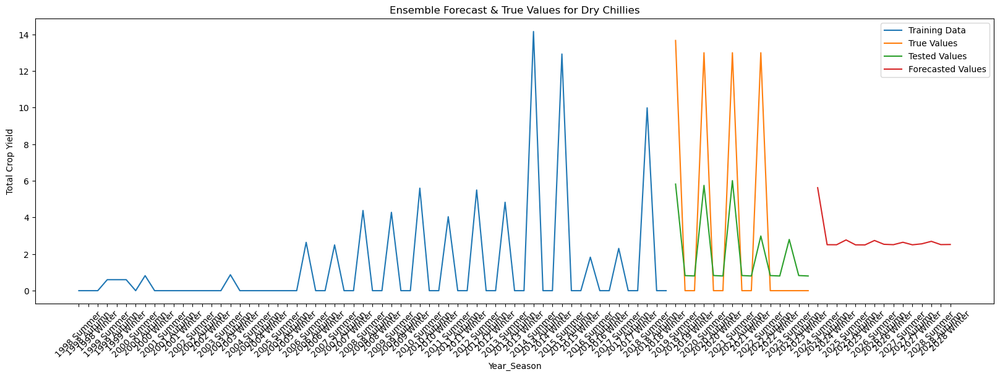

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4645  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3393
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3350
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4052
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2831
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3920
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2587
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3118
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2789
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2369
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Cowpea: 0.0793600392105023


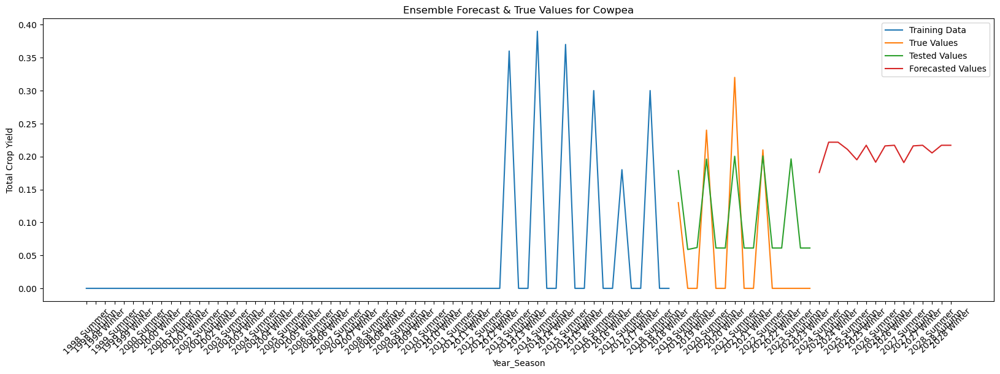

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9662  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9677
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8272
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8762
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0829
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5142
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0456
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6327
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9254
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6122
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6243  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5565
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5120
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5075
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1567  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9347
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8011
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1446
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8538
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0712
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9748
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8985
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9722
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9720
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Cotton: 0.48701054962633844


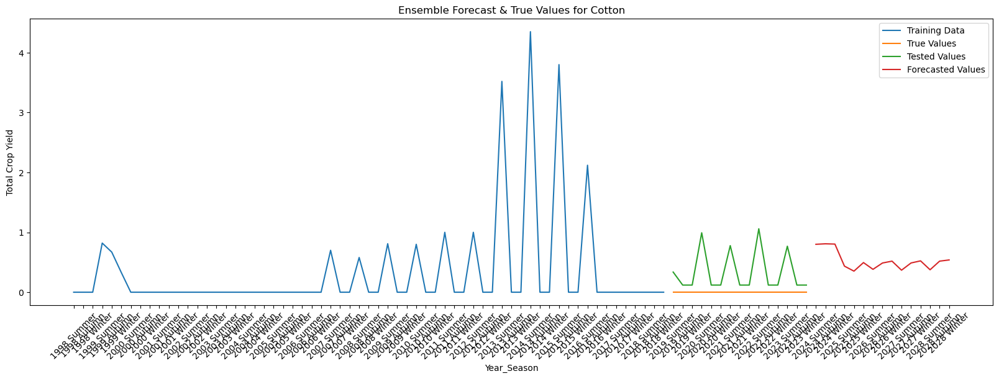

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6689  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6015
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4623
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5508
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4884
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4587
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4393
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5165
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3977
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6113  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6072
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6320
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7245
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7343  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7053
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7499
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5866
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3772
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6244
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7029
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9476
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6510
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7425
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3970  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4372
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4173
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3207
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4196
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3971
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3955
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4067
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4371
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7230  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4138
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6890
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4450
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6222
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5353
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4344
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5210
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4134
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3930
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4904  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5025
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5189
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5357
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4240
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4697
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5747
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5226
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3209
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4057
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5651  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4740
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7703
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5429
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5128
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4920
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5024
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4925
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4129
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4435  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5049
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4481
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2831
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4362
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3915
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3198
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3241
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3710
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3713
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2708  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4818 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2938 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2993 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3280
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3188
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2025
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2791
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3361
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Urad: 1.508466431443569


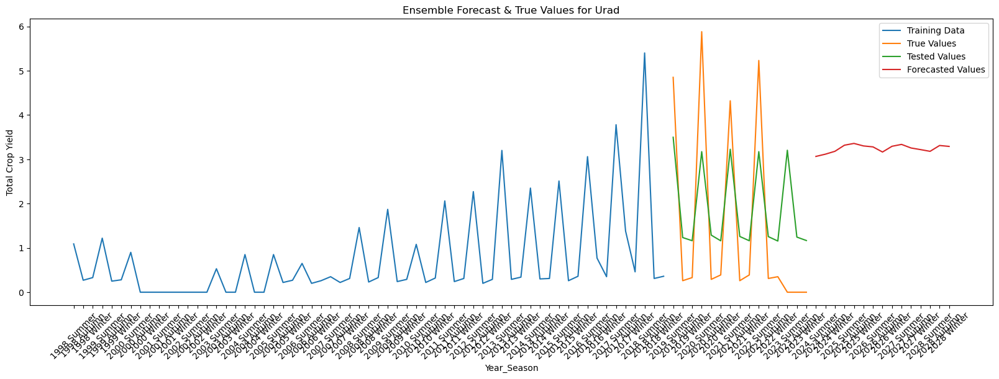

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3431  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4800
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2353
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3151
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3261
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3037
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3382
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2976
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3004
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3549
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7683  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6092
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5966
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8010
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7732
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6274
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7928
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7359
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4108
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3927  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2941
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3180
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3695
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

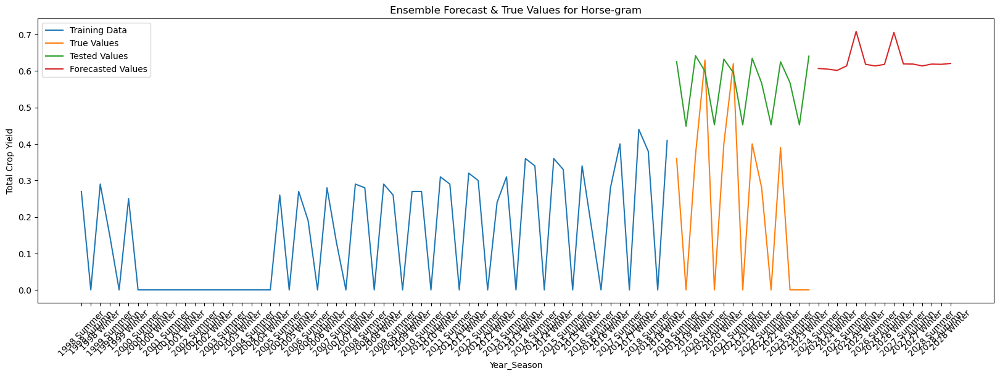

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0274  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6893
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7288
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7400
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1170
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4396
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8377
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0682
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1388
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7083
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7235  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9981
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2036
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1474
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1581
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0678
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2360
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9512
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4345
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4758
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0334  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3684
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1309
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3583
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0713
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0525
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3467
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9984
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0866
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8756
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5808  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6438
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5593
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5506
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4775  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5827
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6383
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5513
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5863
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5748
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6454
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5400
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4740
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5815
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6246  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5962
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8988
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7023
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6191
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6144
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6871
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7193
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7915
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6464
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6160  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2711
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1717
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2229
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3999
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3603
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6451
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5790
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2627
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Groundnut: 3.272159110402763


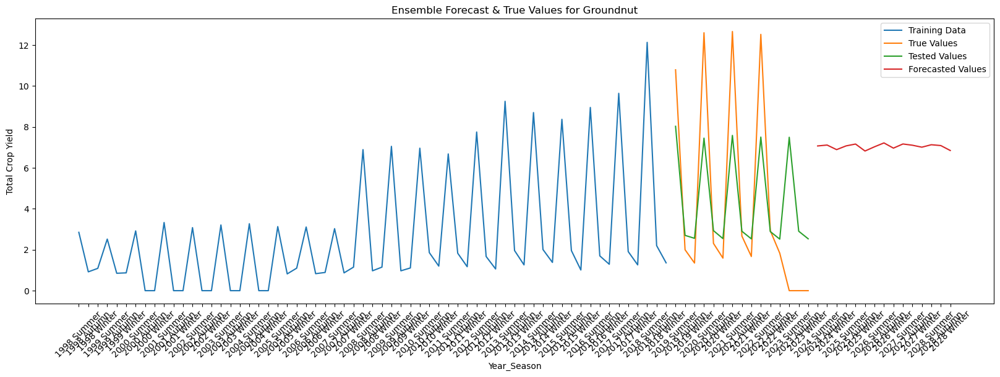

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9466  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3605
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2090
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4863
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2345
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4306
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1322
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8937
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9888
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9222
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5397  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5693
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4774
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7297
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5221  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6046
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4343
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8773
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1930
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9817
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0236
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8410
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9063
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.0652
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Bajra: 1.8847476857075527


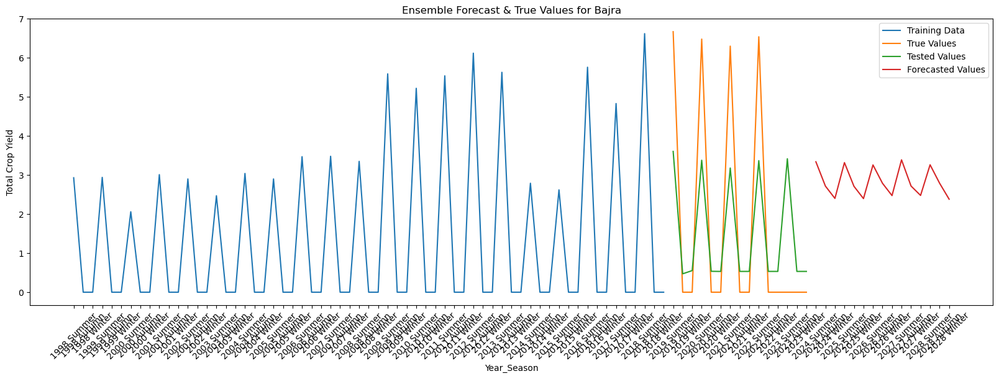

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1506  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2097
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2094
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2254
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1642
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1791
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2149
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1974
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1519
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1773
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0980  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8255
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9130
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9418
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8512
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7330
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3599
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7528
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8803
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6913
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4586  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4497
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3911
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3772
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4105
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4104
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3278
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3804
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3288
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2576
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Rapeseed & Mustard: 0.21602195830761198


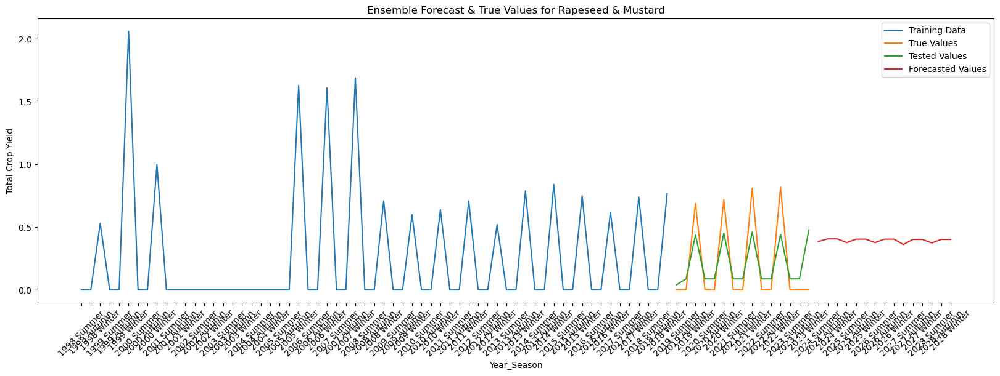

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 80.0344   
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 66.1489
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 81.4219 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 67.7846
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 82.1071 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 66.4761
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 69.6947
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 58.4351
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 47.9275
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 78.5945   
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 36.0281  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.1280
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.2237
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 48.5825
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 38.2311
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.3662
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.9895
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.5783
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 34.0542
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33.9860
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1078.6941  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1033.5452
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1041.0906
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1052.2174
Epoch 5/10
2/2 ━━━━━━━━━━━━

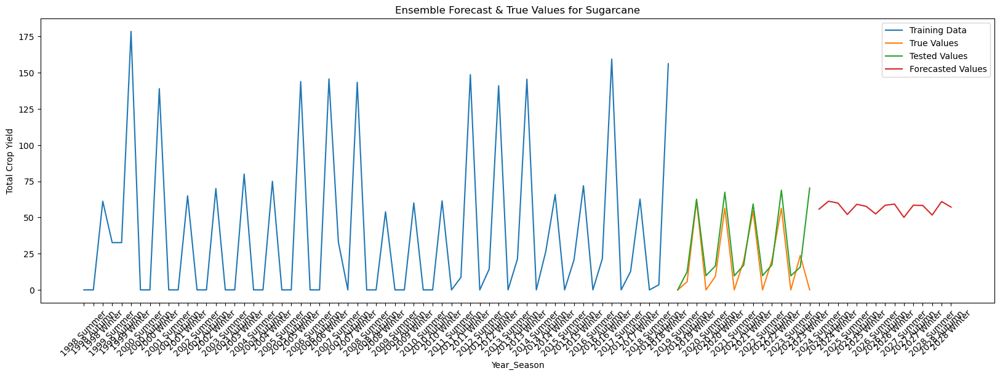

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 11.0211 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.1447
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.6024
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.8045
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.0206
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.0021
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.5021
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.3051
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.9446
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.2237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5408  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3711
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7390
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5274
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

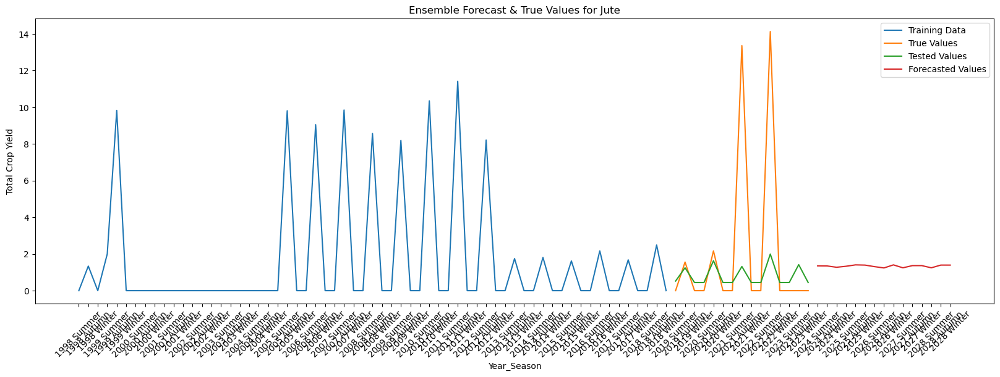

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7437  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6156
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9476
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7731
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7669
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5140
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6080
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5770
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7199
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7652
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Ginger: 0.00260918713360561


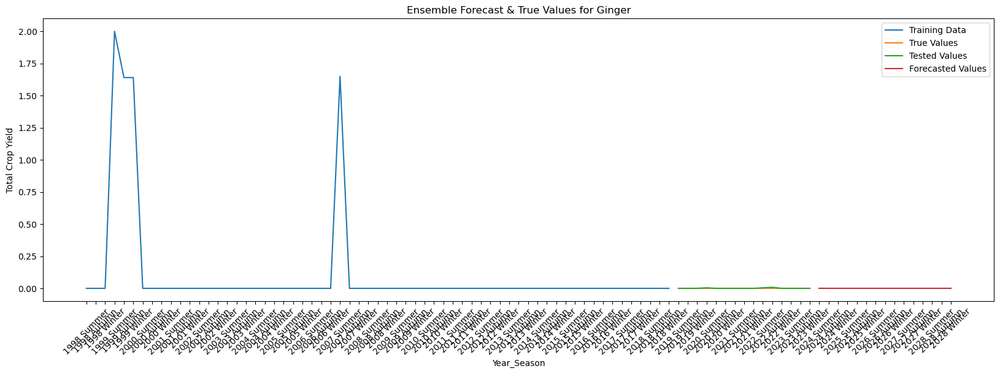

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5394  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7764
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7860
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5112
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8883
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7925
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6415
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8379
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8599
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6282
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 270.5547  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226.8953
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 306.4049
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 286.4179
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 317.3023
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266.3428
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264.3532
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252.5781
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 274.7219
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 294.3603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 10.5862 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.4205
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.1702
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.9053
Epoch 5/10
2/2 ━━━━━━━━━━━━

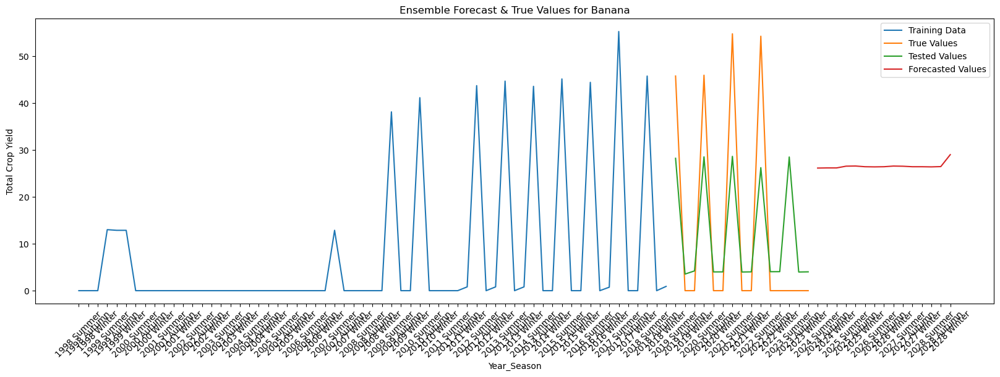

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4540  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4981
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5808
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5634
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4084
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4692
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3657
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3398
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3288
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5644  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3649
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9119
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4926
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0928
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3575
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1510
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7641
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9673
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4331
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9476  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1927
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9544
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8401
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8980
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7832
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6544
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9985
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7401
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8077
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7801  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8385
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7290
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6681
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5331
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8749
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7989
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6488
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7318
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3816  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4915
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4115
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3594
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

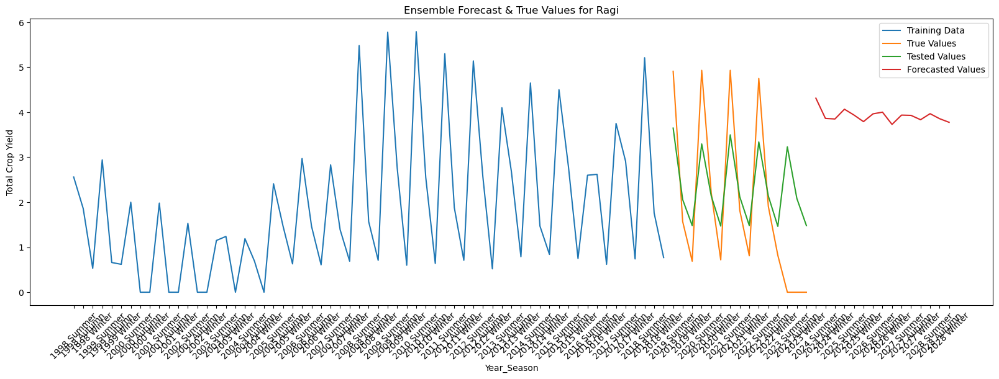

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 44.8561  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39.5531
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.4031
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 39.5953
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.0410
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.8815
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.8644
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 32.2678
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 44.2721
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.2244
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 13.4041  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.5886
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 10.9683
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.0690
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.2419
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.1709
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.4864
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.8123
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.0418
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.1907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5274  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6183
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5989
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6810
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 12.1495  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.5264
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.1991
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.5787
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5432
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.7536
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.3273
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.7198
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.0255
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.3701
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.5320  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.7790
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1472
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.5026
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.9077 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0361
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.4282 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.2260 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9889
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5809
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Potato: 11.366557287819523


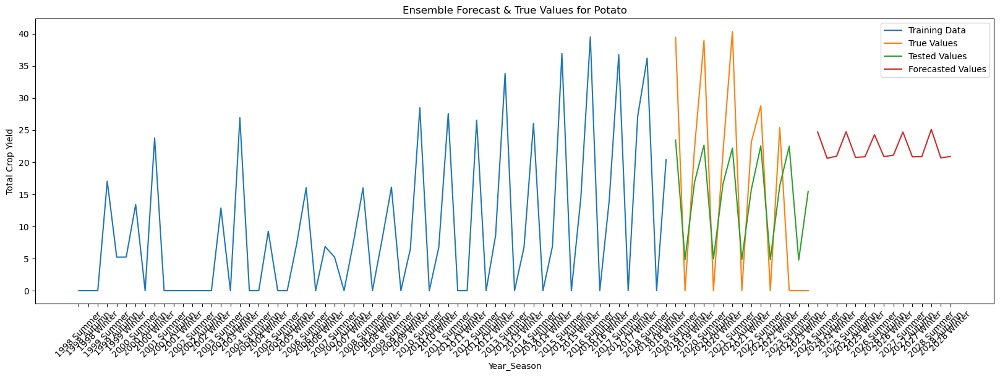

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6523  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3665
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4218
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5603
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3781
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4569
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3692
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3672
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3550
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3541
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.0456  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3226
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2441
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1691
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8111
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4154
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2394
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2412
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7730
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.5050
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Peas & Beans: 0.16299804815870372


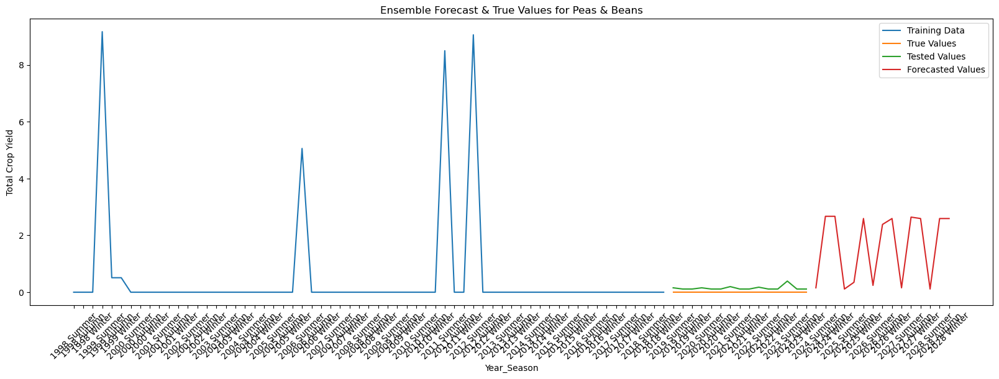

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5096  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4947
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4399
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4135
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5659
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4096
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5352
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4999 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3738
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0122  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1287 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1558
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3280 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7200
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1666 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1407
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0092
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2480
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8952
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6152  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8187
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5530 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3236 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/s

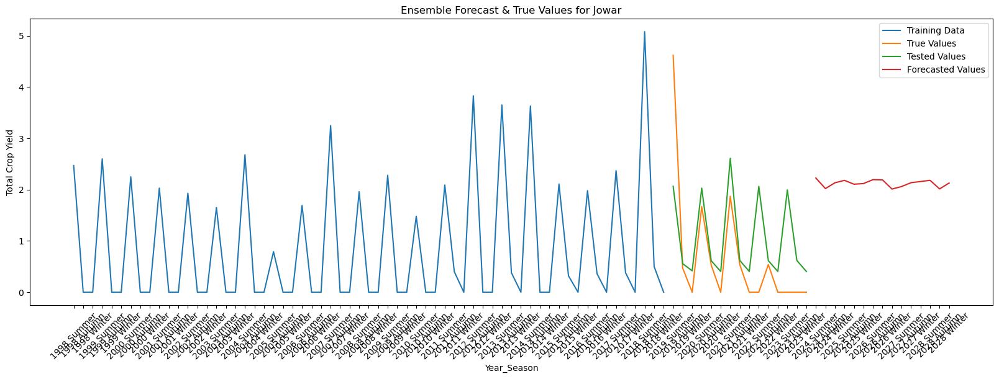

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4335  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3689 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4444 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4159 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3054 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3863 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3892 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3883 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3263 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2704 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5291  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6297 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4884 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5336 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3492 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6504 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4501 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4264 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5771 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4217 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1031  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2500
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4141 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1569 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0109 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8117
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0891 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9635 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1733 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8561
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0740  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0078
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7310
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7307 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6641 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9878
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8194
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6423 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5909 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5378  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4508 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3473
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3204
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3789 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3599 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3895
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3013 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3851 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3047 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Sunflower: 0.8693544972852909


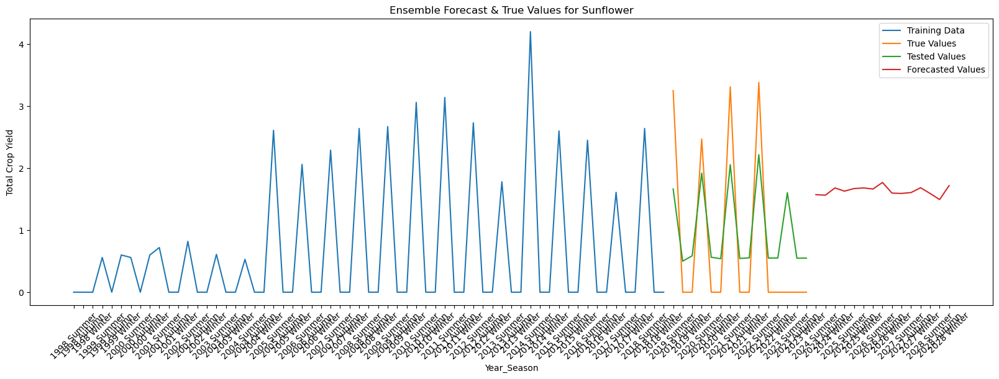

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8081  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8008
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5457 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6377 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7836 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6381 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7989
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5922 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6543 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5650 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7974  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8187
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8644
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5493
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3691 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5173 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6339 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6702 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5970 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6997 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.1644  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6997 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.4427 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1157 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1113 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2742 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0115 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7639 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5086 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9721 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9054  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9303
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9628 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0209
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1179  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3415
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1211 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8267 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6758 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1453 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8208 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1276 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8884
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7474 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3699  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4269
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3422 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3928 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4291 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3823 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2398
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3138 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2600
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2923 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.0079  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7279 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3642 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.7176 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.4687 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.4686 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8665 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0966 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1871 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.5760 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4028
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0351 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0312 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1362 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9113 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9305 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4299 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8315 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1703 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1361 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7406  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8440
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6747 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6419
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5350
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5492
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7083 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2998 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3229 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2696 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1535  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2758
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7839 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7737 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5076  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4884
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4681
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3241
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4297 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4221
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2727
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5270 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4722
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2577 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 18333.6738  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18348.4805
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18330.0781 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9460.3477
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18351.3320 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18325.4609 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18348.6074
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18305.1406 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18355.4023 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18329.5703
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.7671  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.5073
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.6688 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6748
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3954
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6381 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6594 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2206 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.9713 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.7401 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Maize: 8.104044445194745


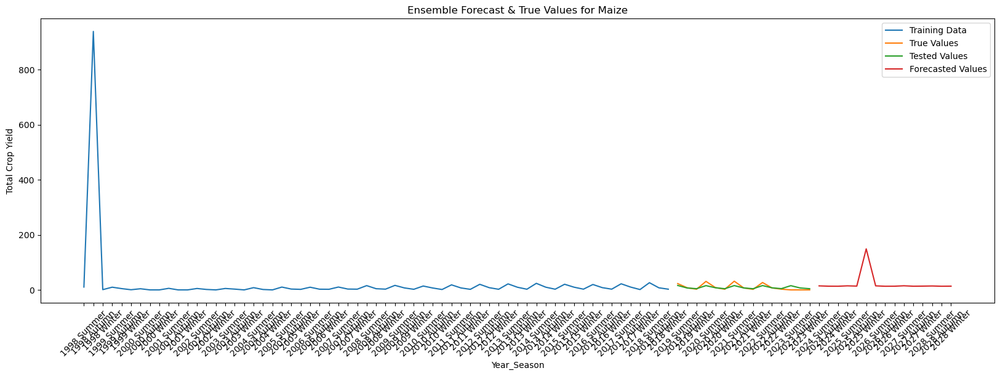

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8218  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8217
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6313
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9311
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6443 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8862
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7567
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7587 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7154 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7316 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.5908  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.3637
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.6775 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.7475 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.9848
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.9226 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8971 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8287 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8408
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.7568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9926  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9018
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3081
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0063
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/s

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1704  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2973
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3530 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5850 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2495 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1492 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0790
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5264
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2316
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4298
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0788  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3760
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4365 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0256
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/s

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4245  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3769
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9011
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4680
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4112
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3366
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2022 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6421 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1457
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5227  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6480 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0079 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.2079 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4782 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4082 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2545 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2922 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4266 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9597 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3759  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4181 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4503 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4498 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optim

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4377  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5951 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8091 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6089 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5073
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5450 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6360
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4810 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5451
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.7244  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.5931
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4510 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4464 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 11.3311 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.2187
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.5074
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.1075 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.3874
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.4316 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.2431 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.0013
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.3585
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.1274  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3281
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.4880 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9770 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2437  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7917
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9924
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9187 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8560 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5823 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8874 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6142 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7844 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3647 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.6169  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5095
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6824
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5645
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6050 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0918 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4316
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5966
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9314
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3644
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8606  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0182
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9997
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1461
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8427
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9437 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8451
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8565 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9492
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6061 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7951  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1717
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8059 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7406
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7283 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4739 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8045 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1021
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4682
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2733 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Rice: 11.398078412877629


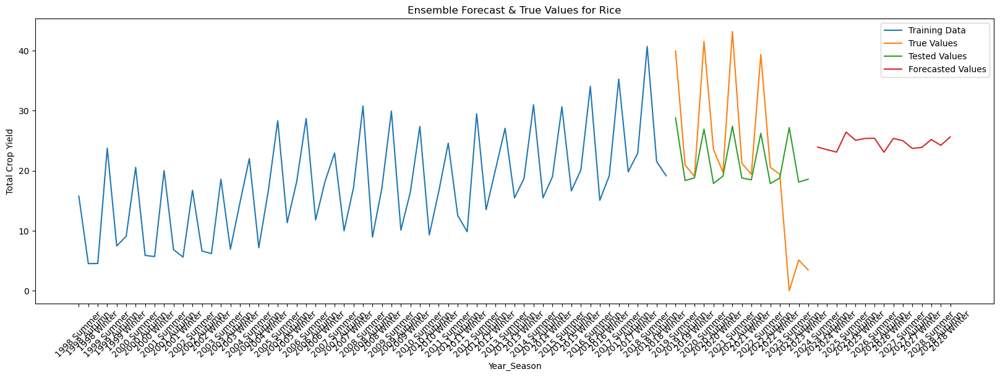

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8239  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5960
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8797
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5749 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9128 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8959
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6197
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4595
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7852 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6515 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 23.2220 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 32.0624
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.7278
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 29.8944
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 13.9590  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.3871 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.0158 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16.8960 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10.2141
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.8997
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.7122 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.1721
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.3152 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.8151 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0094  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7919 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9739 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9463 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 68.2631  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 73.4894
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 89.3858 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 83.5331 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 75.6822 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 97.1491  
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 81.5963 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 78.2969 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 97.0314  
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 89.9271 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2672  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7732
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.8670 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9220 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2465 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5016 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5332 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2378 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.1721 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7926 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Onion: 15.504733278802002


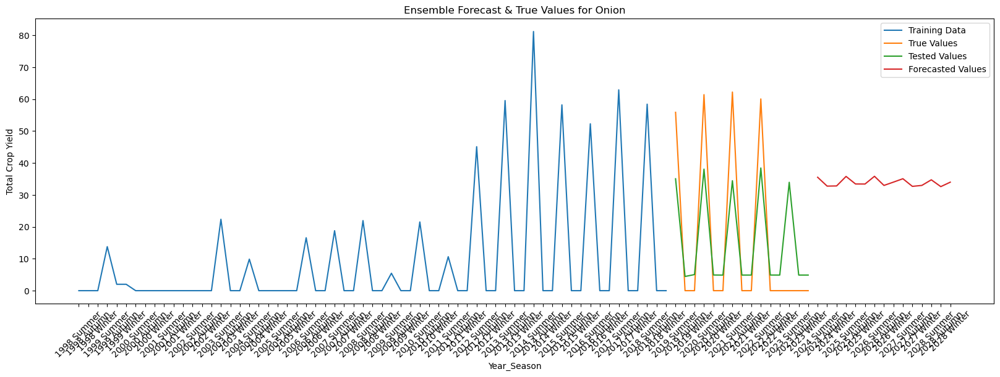

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6705  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5989
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4534 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5007
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7014 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4386 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5613 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2338 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4744
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5363 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4240  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5304
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6017 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4299 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3336  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2672
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2134
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1955 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2923 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1864 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2332 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2644 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1993 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2207 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5432  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3679 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4983 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6279 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3661 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4548 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5132 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5351 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3901 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4523 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3867  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5974 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3794 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3923 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3684 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4600 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3380 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4733 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3789 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3849
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6669  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2132 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8564 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7139 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0656 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8789 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0513 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8020 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8207 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6968 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2466  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4024 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4598 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3603
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2502
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3240 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3411 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3098 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3337 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4182 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5333  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5070 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3928 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4094 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3398 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4392 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3697 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3725
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4006 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3913 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8520  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8452
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5380 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6208 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7650
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5427 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4058 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6248 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4644
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4972 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6717  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6986 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5122 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5610 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4285 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3950 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6598 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5665 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6383 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5853
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6389  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4693 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7600 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5330
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 

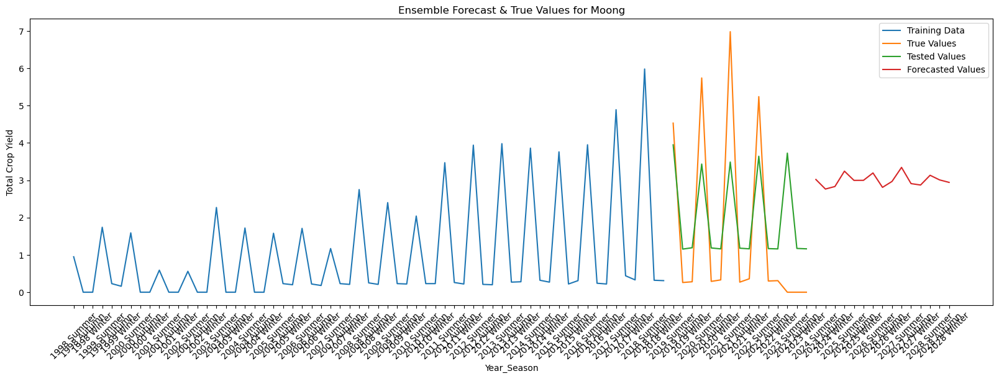

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1762  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2241 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2171 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2564 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3948 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1968 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2264 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1784 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2067 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2438 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5975  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6705
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4662 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5092 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4867 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6928
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6184
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3640 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5983 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6375 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Niger seed: 0.17504511708403442


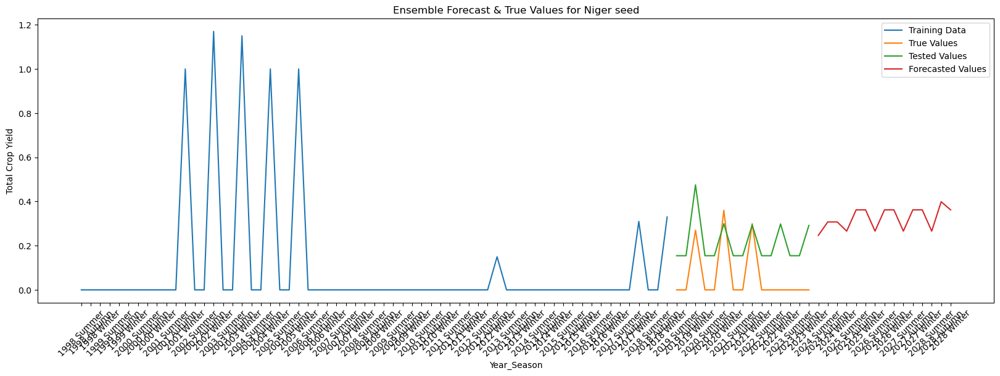

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5614  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5154 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4791 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6362 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5953 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5064 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6097 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5815 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3769 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4721 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5168  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5238 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3553 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4022 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3411 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4642 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5942
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4403 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3575 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5234 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Other Summer Pulses: 0.5373601437741724


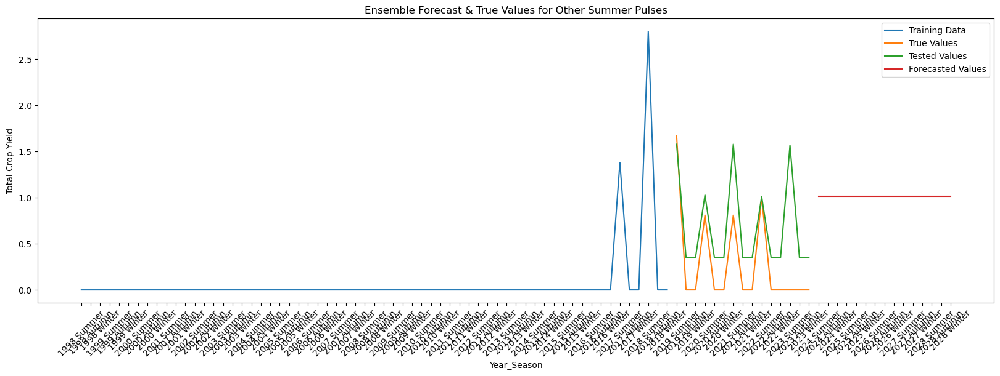

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3918  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3801 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4557 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4133 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3200 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4117 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3491 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3488 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3680 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2469 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Gram: 0.03325768015155251


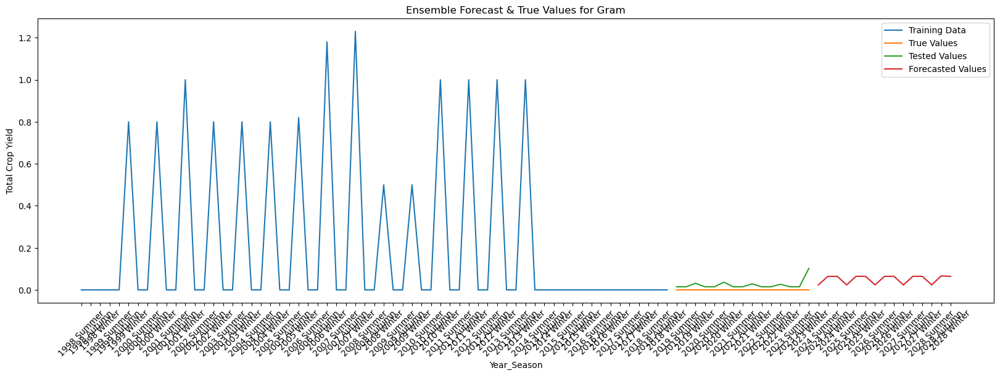

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3231  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3117 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3247
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2883
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2886 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2583 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2705 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2603 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2389 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1905
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4008  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4535 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3430 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2753 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5081 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4295 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3188
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4318 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3294 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3246
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8400  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5458 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4979 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5999 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5715 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9459 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6834 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7877 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8261 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5622 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5547  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4435 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7286 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4542 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5440 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5631 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4697 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6361 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4084
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5799 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Arhar/Tur: 0.36272743466211166


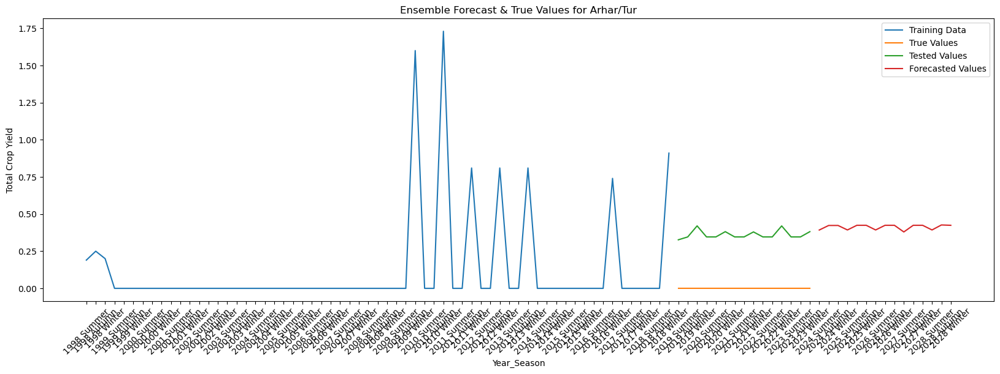

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5985  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5574 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5924
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4347 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5428 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4867 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5374 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5334 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3011
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4834
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Soyabean: 2.5718179875283154e-07


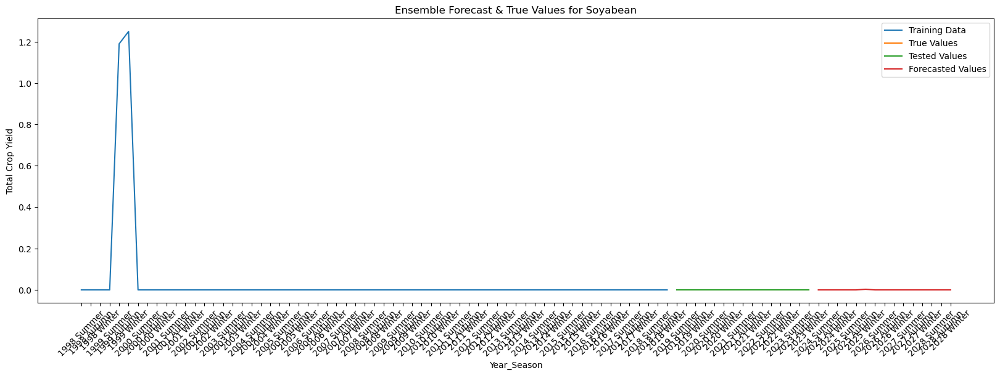

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5913  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5866 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6538 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5524
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4007 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6466 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4057
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4523 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5023 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4909 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Coriander: 0.001633034472636392


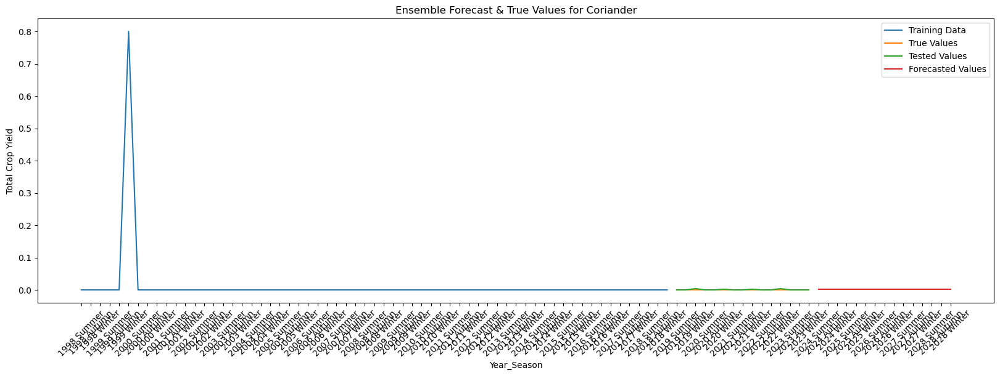

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0062  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7941 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8352 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7231 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8858 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8099 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7591 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7061 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6233
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6403
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1602  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.6118 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2980 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7630 
Epoch 5/10
2/2 ━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6386  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4888
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4499 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3707 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4156 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4040 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5127 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4318 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4539 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Wheat: 1.1093804182778366


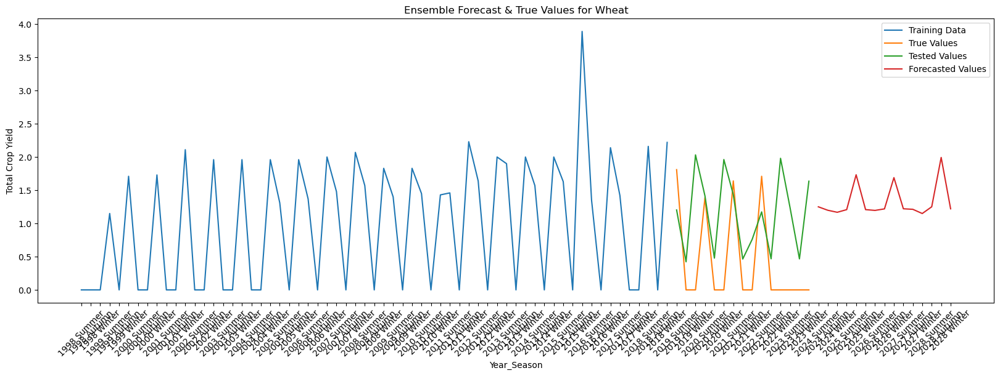

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5373  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6123
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7630 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6252 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5822 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5587 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8060 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5278 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5609
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5226 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7690  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8111 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6826 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7635 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6512 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6650 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6176 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6543 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6419 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4892 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Small Millets: 0.29029095618660256


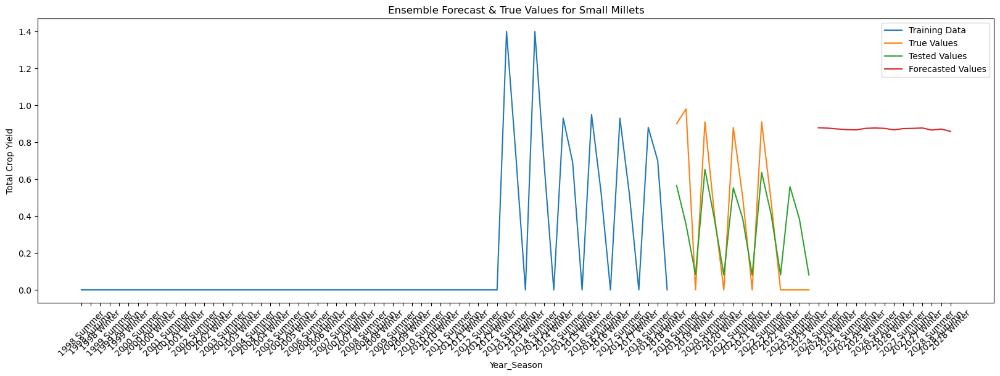

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6042
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4649 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4763
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4251 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3862 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4518 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3719 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5178 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4213 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3869 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5887  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9797 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7796 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5038 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8995 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3808 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9806 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9858 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8171 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0961 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Sannhamp: 0.25843636390112723


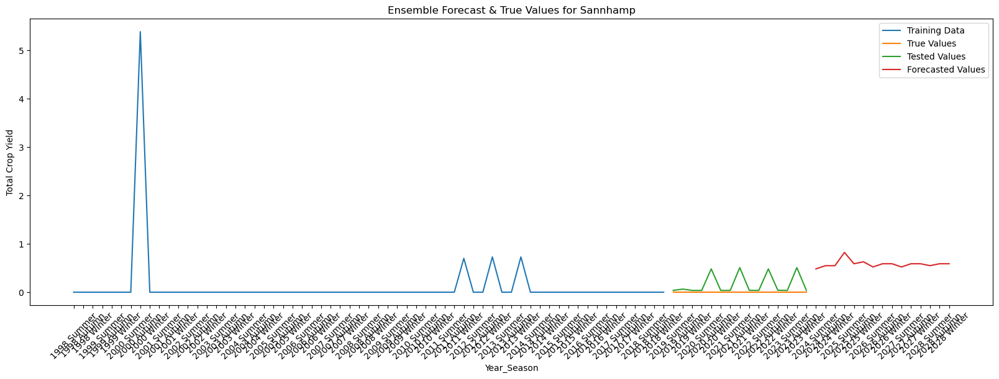

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8571  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0635
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0576
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5806 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2075 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1235 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9307 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2859 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4173
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7247
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Tobacco: 0.6567019413707977


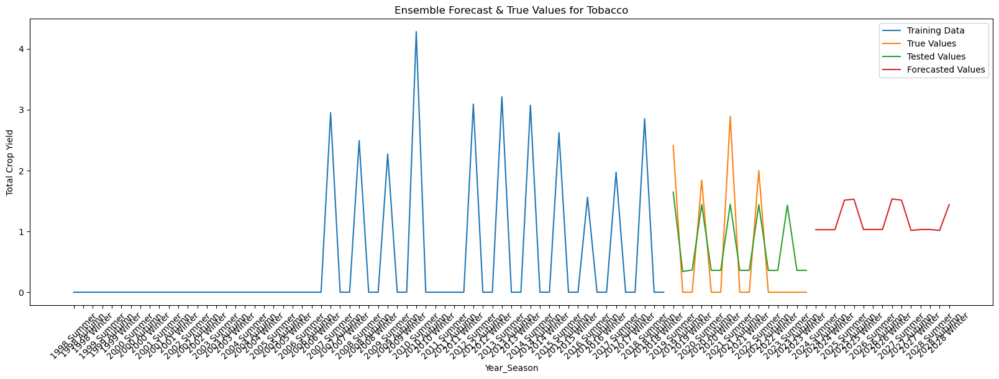

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7070  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0124
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7366
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7533 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6436
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0921 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8945
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7461
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8550 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5524 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Tapioca: 4.5639229040966147e-07


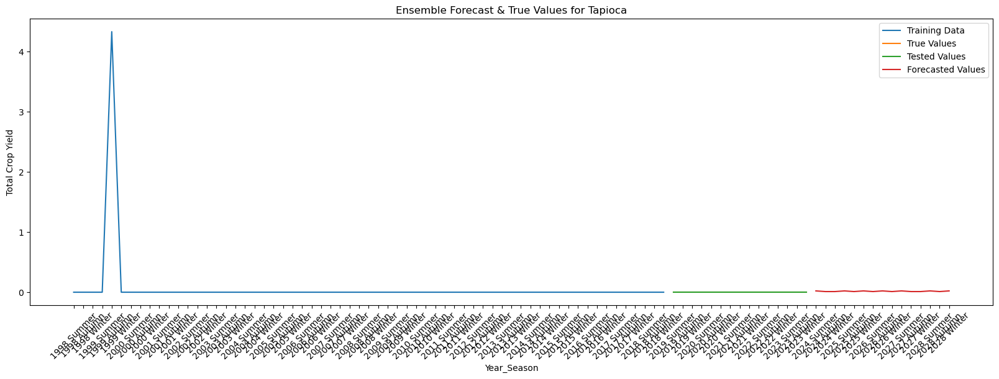

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5966  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6293
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4422
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5581 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4433 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5722 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4934 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3757
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5696
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5335
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Pulses Total: 0.04299523325248505


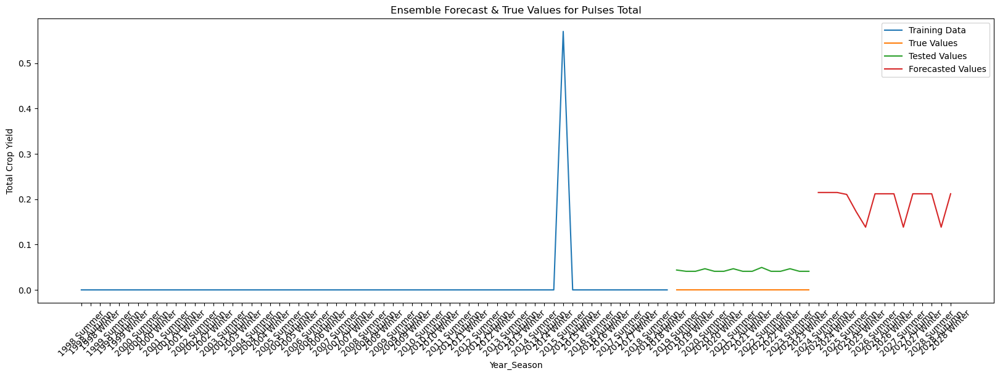

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8634  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5726 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0186
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7946 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5956
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6433
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5067
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5298
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7639
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8660
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Sweet potato: 6.956556851527854e-07


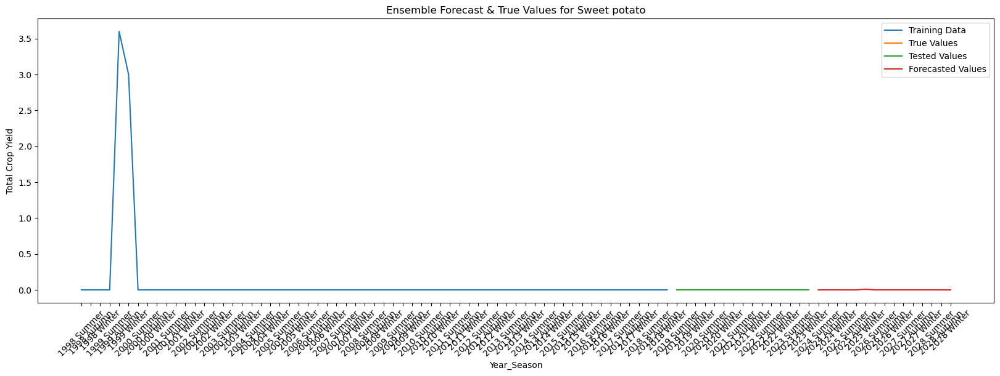

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5503
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8838
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7744
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5798
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6630
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6873
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7808
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7706
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4730
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4411
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Total Foodgrain: 0.01895327282782031


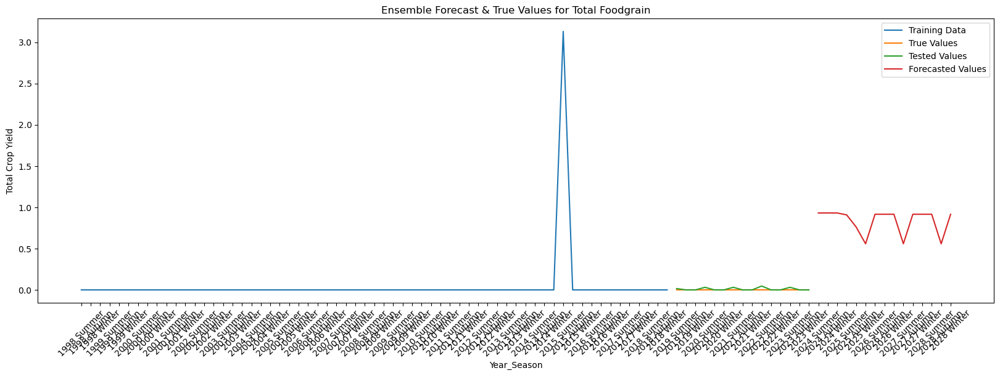

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6687  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6762 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8455 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4433
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4897
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5884 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5413 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5578
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7142 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5653 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Turmeric: 0.23533981592125322


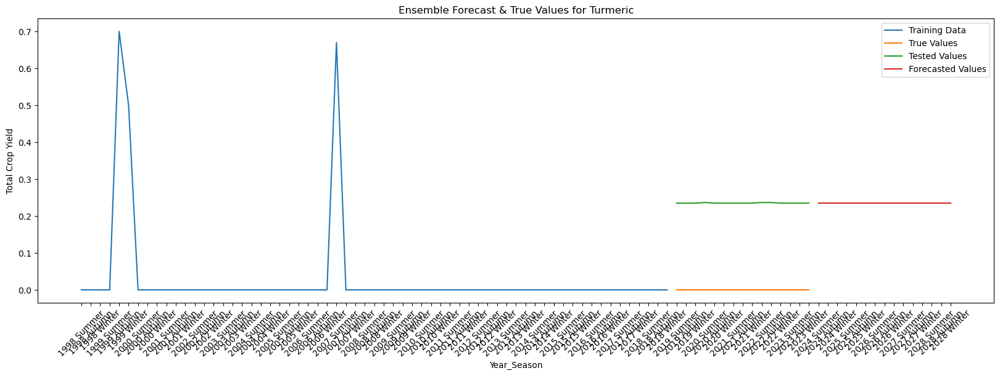

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4241
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5616
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4267
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5653
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6067 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5663
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4986 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4902 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3585 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3943 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Other Rabi Pulses: 0.12209773282202221


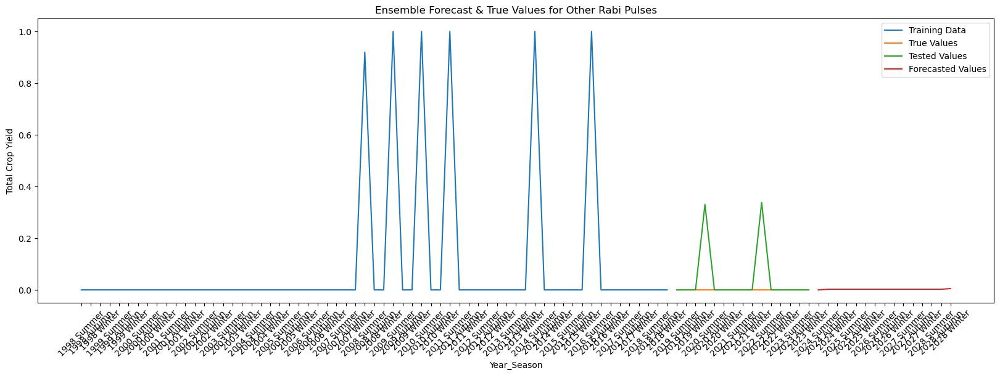

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 22.9294  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 21.0632 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 24.2172 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 26.1136 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 24.9031 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18.2233 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 24.5576 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19.6043 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 21.6663 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.6526 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Brinjal: 0.8620011972825616


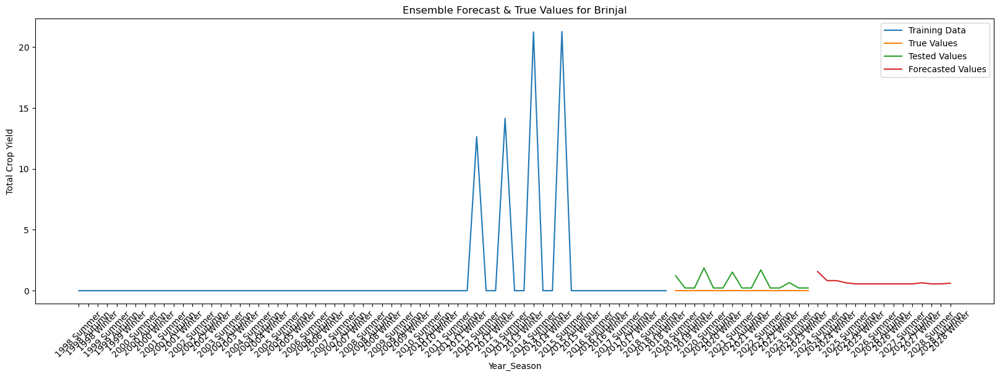

Average Ensemble RMSE: 2.761905179787062


In [6]:
df_ensemble = hist_df
df_ensemble_future = future_df

def map_season(season):
    return '1' if season == 'Summer' else ('2' if season == 'Autumn' else '3')

df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble = df_ensemble.sort_values('Year_Season')
df_ensemble.reset_index(drop=True, inplace=True)
df_ensemble_future['Year_Season'] = df_ensemble_future.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble_future = df_ensemble_future.sort_values('Year_Season')
df_ensemble_future.reset_index(drop=True, inplace=True)

ensemble_rmse_scores = []

for crop in df_ensemble['crop'].unique():
    df_crop = df_ensemble[df_ensemble['crop'] == crop]
    df_crop.reset_index(drop=True, inplace=True)
    df_future_crop = df_ensemble_future[df_ensemble_future['crop'] == crop]
    df_future_crop.reset_index(drop=True, inplace=True)
    
    rf_all_states_per_crop = []
    gb_all_states_per_crop = []
    arima_all_states_per_crop = []
    attention_lstm_all_states_per_crop = []
    
    rf_all_states_per_crop_forecast = []
    gb_all_states_per_crop_forecast = []
    arima_all_states_per_crop_forecast = []
    attention_lstm_all_states_per_crop_forecast = []
    
    true_values_all_states_per_crop = []
    train_values = []
    
    for state in df_crop['state'].unique():
        df_crop_state = df_crop[df_crop['state']==state]
        df_crop_state.reset_index(drop=True, inplace=True)
        df_future_crop_state = df_future_crop[df_future_crop['state']==state]
        df_future_crop_state.reset_index(drop=True, inplace=True)

        df_crop_state_train = df_crop_state[df_crop_state['year']<=2018]
        df_crop_state_test = df_crop_state[df_crop_state['year']>=2019]
        df_crop_state_train = df_crop_state_train.drop(columns=['year', 'season', 'state', 'crop', 'Year_Season'])
        df_crop_state_test = df_crop_state_test.drop(columns=['year', 'season', 'state', 'crop', 'Year_Season'])
        X_future = df_future_crop_state.drop(columns=['year', 'season', 'state', 'crop', 'Year_Season'])
        
        X_train = df_crop_state_train.drop(columns=['yield'])
        y_train = df_crop_state_train['yield']
        X_test = df_crop_state_test.drop(columns=['yield'])
        y_test = df_crop_state_test['yield']
        train_values.append(y_train)
        true_values_all_states_per_crop.append(y_test)
        
        # Random Forest
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_train, y_train)
        rf_y_pred = rf_model.predict(X_test)
        rf_all_states_per_crop.append(rf_y_pred)
        rf_prediction_future = rf_model.predict(X_future)
        rf_all_states_per_crop_forecast.append(rf_prediction_future)
        
        # Gradient Boosting
        gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
        gb_model.fit(X_train, y_train)
        gb_y_pred = gb_model.predict(X_test)
        gb_all_states_per_crop.append(gb_y_pred)
        gb_prediction_future = gb_model.predict(X_future)
        gb_all_states_per_crop_forecast.append(gb_prediction_future)
        
        # ARIMA
        best_params = {}
        best_rmse = {}
        p_values = range(0, 2) 
        d_values = range(0, 2) 
        q_values = range(0, 2) 
        best_params[state] = (1,1,1)
        best_rmse[state] = float('inf')
        
        # Perform grid search for the current state and crop
        for p, d, q in product(p_values, d_values, q_values):
            if p == 0 and d == 0 and q == 0:
                continue

            # Train ARIMA model
            order = (p, d, q)
            model = ARIMA(y_train, order=order)
            try:
                fit_model = model.fit()
                forecast = fit_model.forecast(steps=len(y_test))
                rmse = np.sqrt(mean_squared_error(y_test, forecast))
                if rmse < best_rmse[state]:
                    best_rmse[state] = rmse
                    best_params[state] = order
            except:
                continue

        # Train ARIMA model with best parameters for the current state and crop
        arima_model = ARIMA(y_train, order=best_params[state])
        arima_fit_model = arima_model.fit()

        # Forecast with best model for the current state and crop
        forecast = arima_fit_model.forecast(steps=15+15)

        # Store forecasted yield for the current state
        arima_all_states_per_crop.append(forecast[:15])
        arima_all_states_per_crop_forecast.append(forecast[15:])
        
        # Attention and LSTM
        class Attention(tf.keras.layers.Layer):
            def __init__(self, units):
                super(Attention, self).__init__()
                self.W = tf.keras.layers.Dense(units)
                self.V = tf.keras.layers.Dense(1)
                
            def call(self, inputs):
                # Compute attention scores
                score = tf.nn.tanh(self.W(inputs))
                attention_weights = tf.nn.softmax(self.V(score), axis=1)

                # Apply attention weights to input
                context_vector = attention_weights * inputs
                context_vector = tf.reduce_sum(context_vector, axis=1)
                return context_vector
            
        def build_model():
            inputs = Input(shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]))
            lstm_out = LSTM(64, return_sequences=True)(inputs)
            dropout = Dropout(0.2)(lstm_out)
            batch_norm = BatchNormalization()(dropout)
            attention = Attention(64)(batch_norm)
            output = Dense(1)(attention)
            model = Model(inputs=inputs, outputs=output)
            return model
        
        # Reshape X_train for input to the model
        X_train_reshaped = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
        
        # Reshape X_future for input to the model
        X_test_reshaped = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])
        
        attention_lstm_model = build_model()
        attention_lstm_model.compile(optimizer="adam", loss="mse")
        attention_lstm_model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32)

        # Predict using the model
        predicted_target_values = attention_lstm_model.predict(X_test_reshaped)

        # Post-process the predicted target values
        predicted_values = [item[0] for item in predicted_target_values]
        predicted_values_non_negative = [max(value, 0) for value in predicted_values] 
        attention_lstm_all_states_per_crop.append(predicted_values_non_negative)
        
        # Reshape X_future for input to the model
        X_future_reshaped = X_future.values.reshape(X_future.shape[0], 1, X_future.shape[1])

        # Predict using the model
        forecast_target_values = attention_lstm_model.predict(X_future_reshaped)

        # Post-process the predicted target values
        forecast_values = [item[0] for item in forecast_target_values]
        forecast_values_non_negative = [max(value, 0) for value in forecast_values] 
        attention_lstm_all_states_per_crop_forecast.append(forecast_values_non_negative)
        
    rf_result_per_crop = [sum(values) for values in zip(*rf_all_states_per_crop)] 
    gb_result_per_crop = [sum(values) for values in zip(*gb_all_states_per_crop)] 
    arima_result_per_crop = [sum(values) for values in zip(*arima_all_states_per_crop)] 
    attention_lstm_result_per_crop = [sum(values) for values in zip(*attention_lstm_all_states_per_crop)]
    true_values_result_per_crop = [sum(values) for values in zip(*true_values_all_states_per_crop)] 
    train_values = [sum(values) for values in zip(*train_values)] 
    
    array_rf = np.array(rf_result_per_crop)
    array_gb = np.array(gb_result_per_crop)
    array_arima = np.array(arima_result_per_crop)
    array_attention_lstm = np.array(attention_lstm_result_per_crop)
    averages = (array_rf + array_gb + array_arima + array_attention_lstm) / 4
    
    rf_result_per_crop_forecast = [sum(values) for values in zip(*rf_all_states_per_crop_forecast)] 
    gb_result_per_crop_forecast = [sum(values) for values in zip(*gb_all_states_per_crop_forecast)] 
    arima_result_per_crop_forecast = [sum(values) for values in zip(*arima_all_states_per_crop_forecast)] 
    attention_lstm_result_per_crop_forecast = [sum(values) for values in zip(*attention_lstm_all_states_per_crop_forecast)]
    
    array_rf_forecast = np.array(rf_result_per_crop_forecast)
    array_gb_forecast = np.array(gb_result_per_crop_forecast)
    array_arima_forecast = np.array(arima_result_per_crop_forecast)
    array_attention_lstm_forecast = np.array(attention_lstm_result_per_crop_forecast)
    forecast = (array_rf_forecast + array_gb_forecast + array_arima_forecast + array_attention_lstm_forecast) / 4
    
    rmse = np.sqrt(mean_squared_error(true_values_result_per_crop, averages))
    ensemble_rmse_scores.append(rmse)
    print(f"Root Mean Squared Error (RMSE) for {crop}: {rmse}")
    
    # Plotting the results for the current crop
    plt.figure(figsize=(20, 6))
    plt.plot(list(range(1, 64)), train_values, label='Training Data')
    plt.plot(list(range(64, 79)), true_values_result_per_crop, label='True Values')
    plt.plot(list(range(64, 79)), averages, label='Tested Values')
    plt.plot(list(range(79, 94)), forecast, label='Forecasted Values')
    plt.xlabel('Year_Season')
    plt.ylabel('Total Crop Yield')
    plt.title(f'Ensemble Forecast & True Values for {crop}')
    seasons = ['Summer', 'Autumn', 'Winter']
    years = range(1998, 2029)
    custom_labels = [f"{year} {season}" for year in years for season in seasons]
    plt.xticks(range(1, 94), custom_labels, rotation=45)
    plt.legend()
    plt.show()
    

avg_ensemble_rmse = np.mean(ensemble_rmse_scores)
print("Average Ensemble RMSE:", avg_ensemble_rmse)

### Running Ensemble on Country Level

/var/folders/nx/_bvgjl1d7hg01rqvr_jylx_h0000gn/T/ipykernel_8526/1344013655.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/pyt

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 38.0967 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.9384
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 71.0772  
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.6670
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37.0720
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 67.2056
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 68.2735  
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.8703
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 69.4491 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 69.7546 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


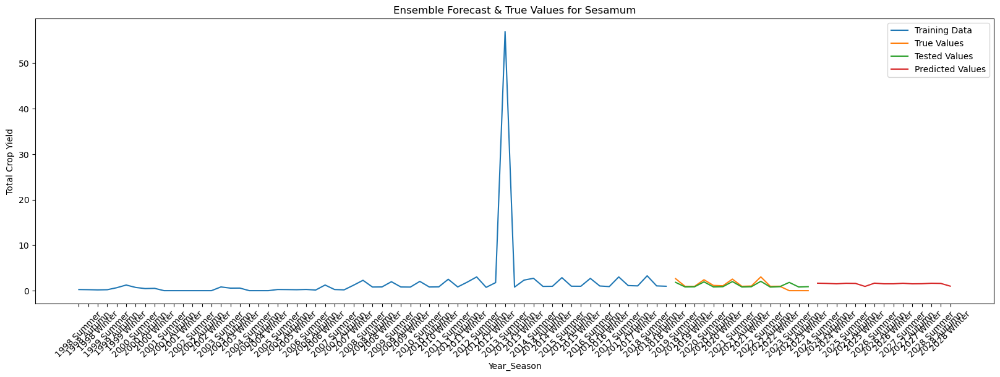

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 11.4815  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.9709
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.2798
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.4429
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.5279 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.3593 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.9585 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.0388
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.4912 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.5299 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


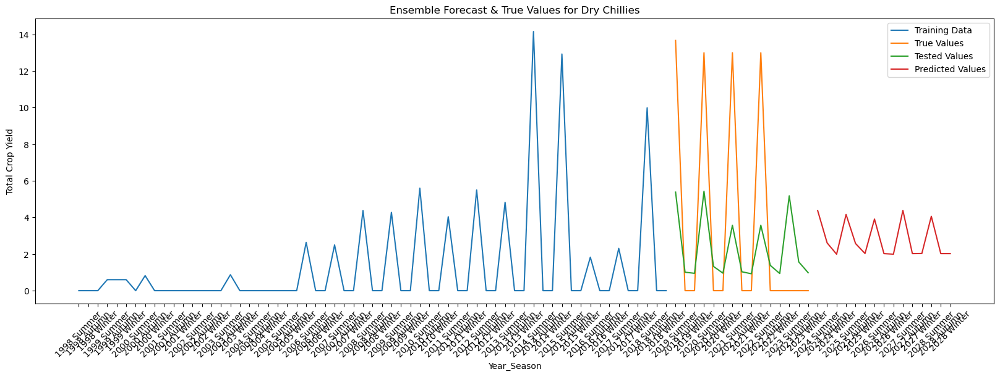

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5131  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4553 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3951
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3578
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4810
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2879
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5217
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3200
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3746
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4168
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


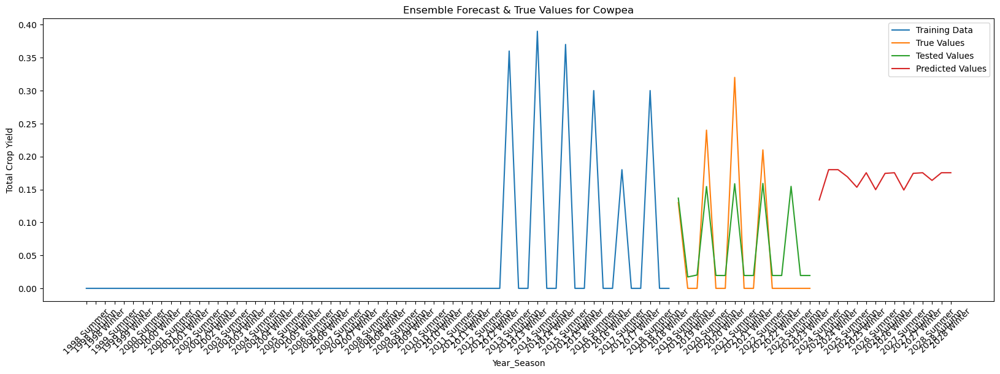

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9728  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1303 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0929
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9539
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5423
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8638
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0819
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9859
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0789
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1289
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


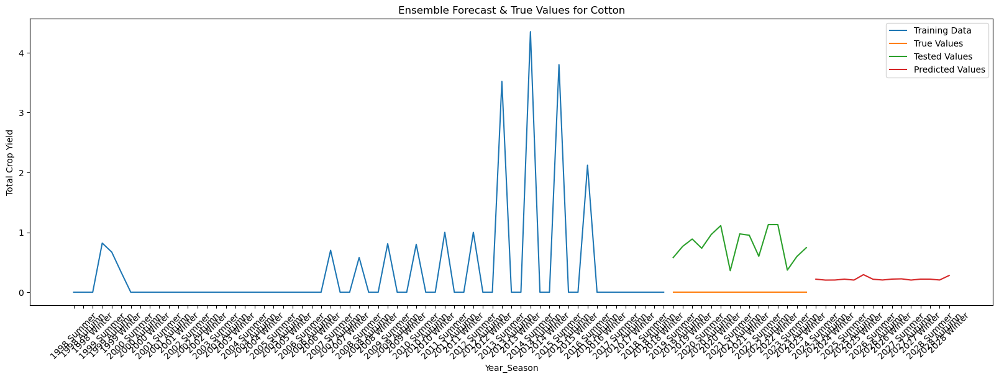

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9642  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3575
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1485 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0508
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2272
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9405
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7183
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5290
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5642
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6590
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


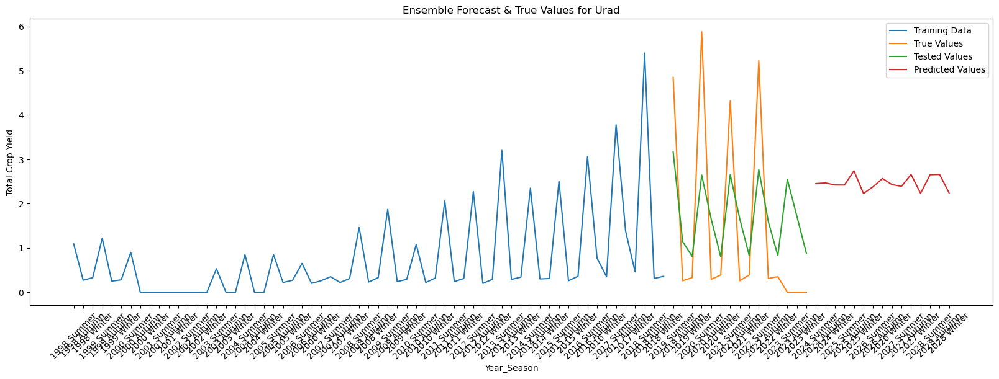

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5243  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5877
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6372
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5640
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3923
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5479
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3974
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3247
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4316
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6746
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


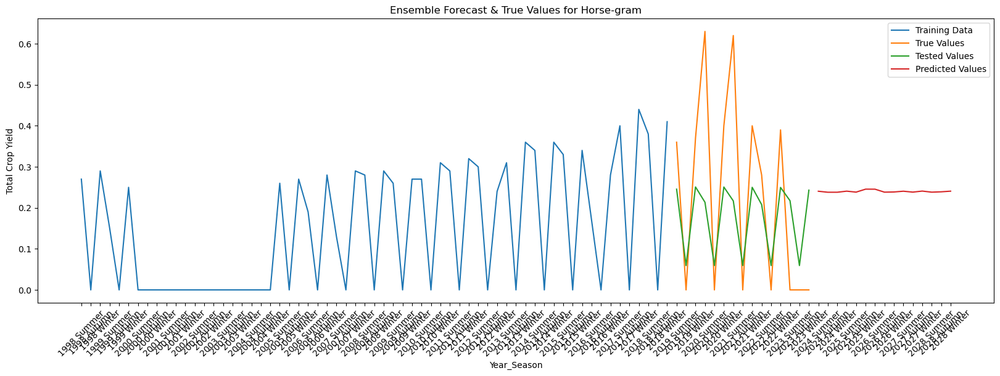

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 15.3643  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.9388
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.4060
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5243
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.6297
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.4763
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.4246
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.1965 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.8134 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.7650
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


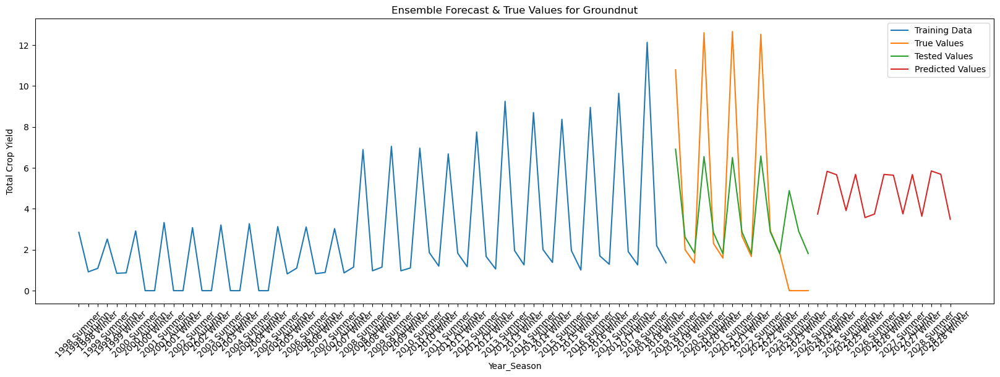

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.5228  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8037
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6222
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.0148
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.0581
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.5167
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6927
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4552
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.0094
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.0015
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


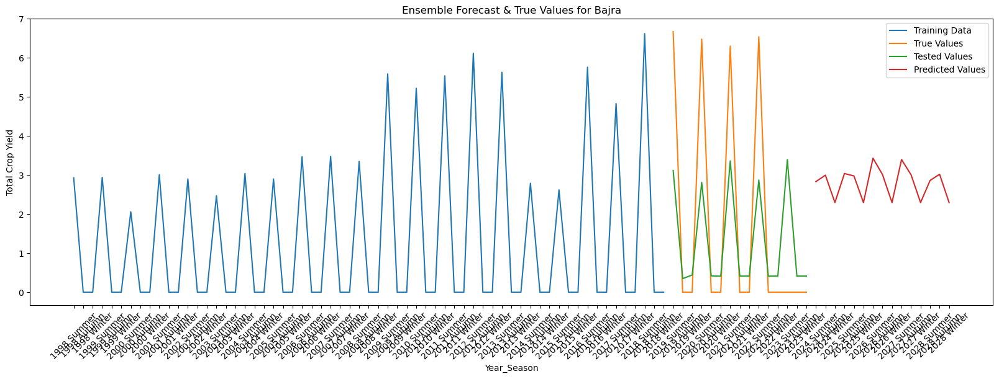

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7042  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6159
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5921
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6746
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5340
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6064
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5829
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5656
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4261
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5384
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


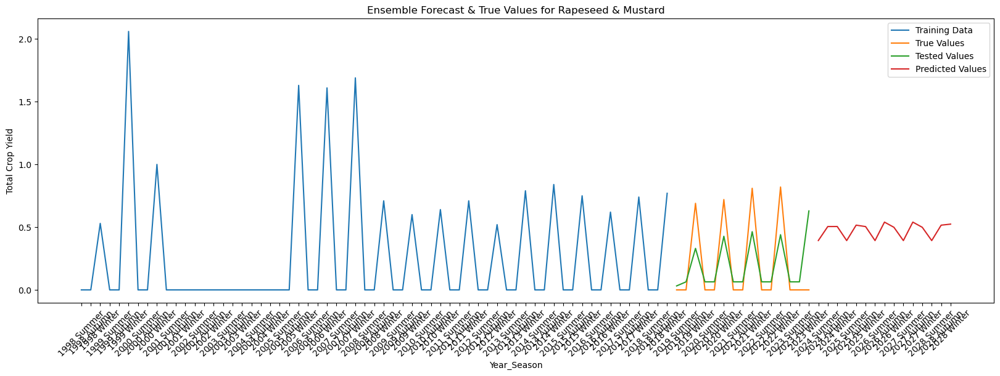

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4380.0854  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4711.6401
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4243.8306
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4664.0884
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3476.7935 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5245.5879
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4544.4878
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4423.4238
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4296.5776 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5065.9702 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


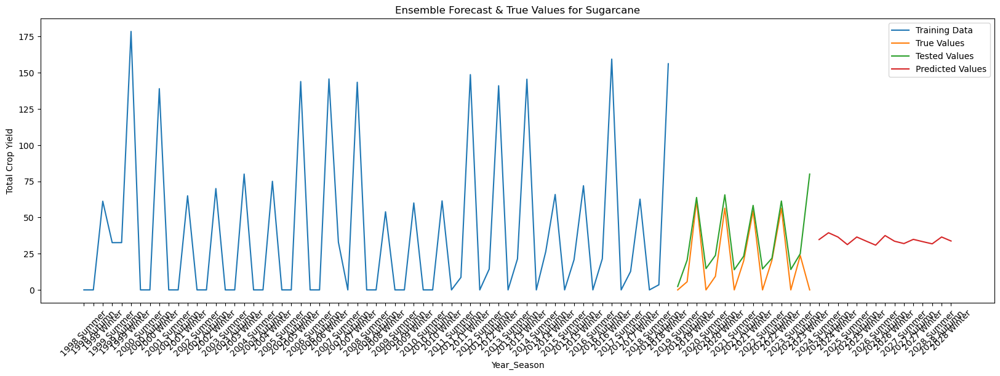

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 16.1567  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.0309 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.0670 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5581
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.7774
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.3576
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.5884
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.4264
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.5116
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.7115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


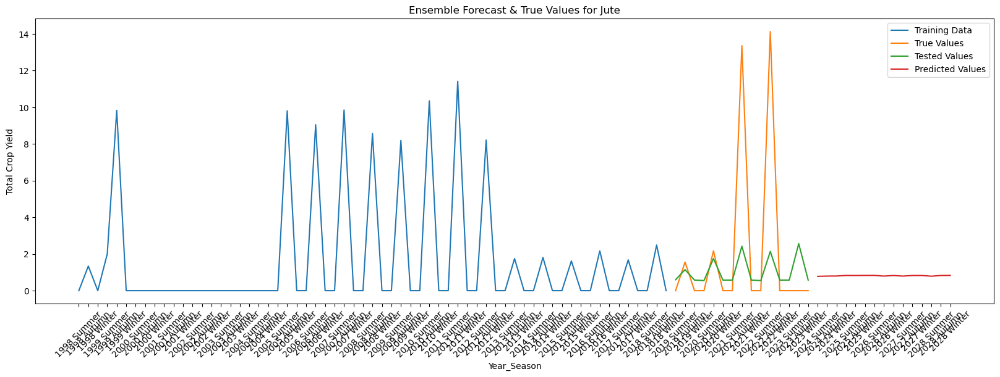

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5831  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9822 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5598
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3339
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6063 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4171
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4500 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4232 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4391
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4213
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


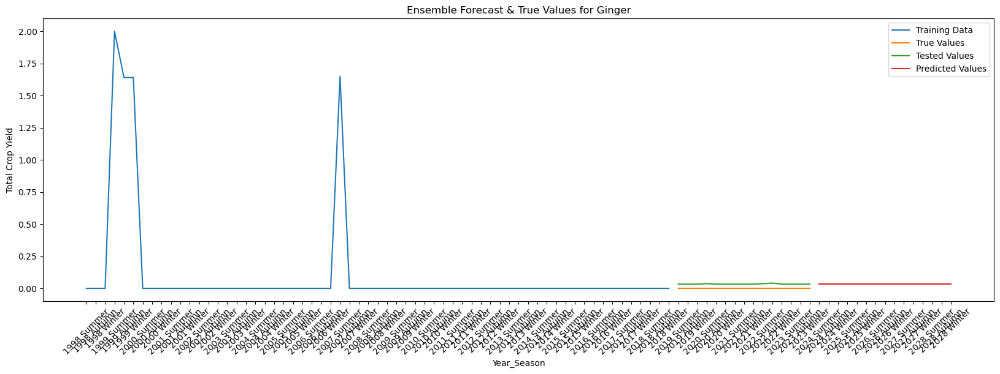

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 220.9597 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243.5959 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 281.5049 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243.3677 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268.6627 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 289.2139 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 280.6710 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 303.6892 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 284.4498 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 298.1419 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


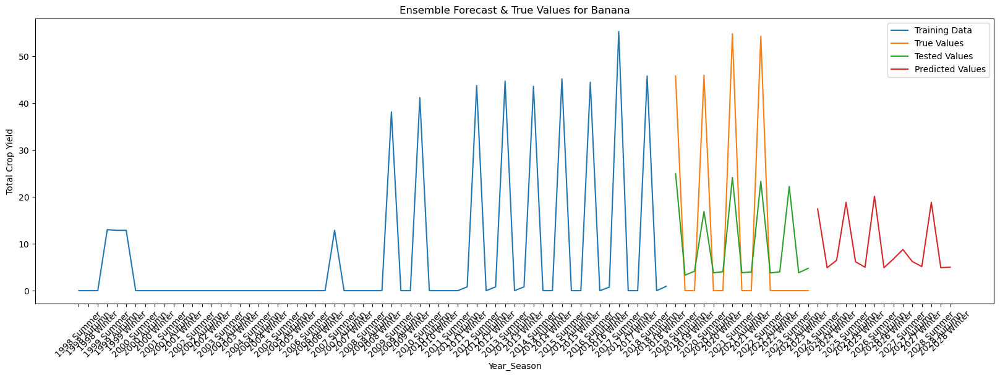

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.4062  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.4136
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6507
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6990
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9463
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1744
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3446
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6395
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4929 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9025 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


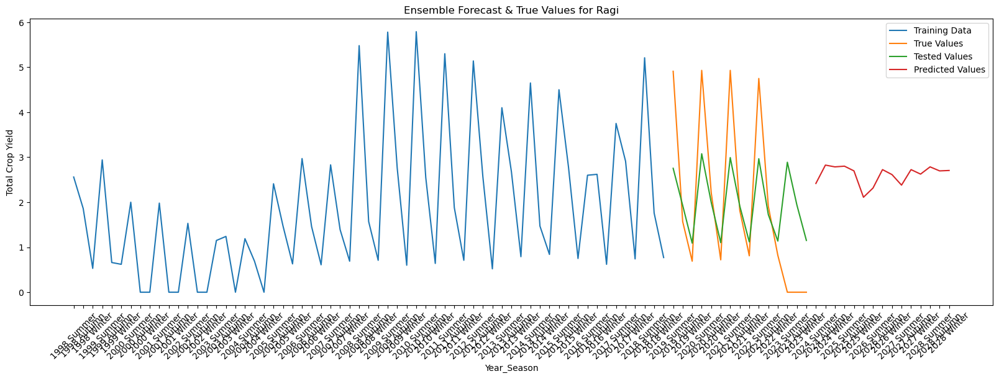

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 210.8628  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 204.6923
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267.2664
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236.8438
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249.4561
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233.2475
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230.1997
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249.6710
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 195.5584
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259.2690
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


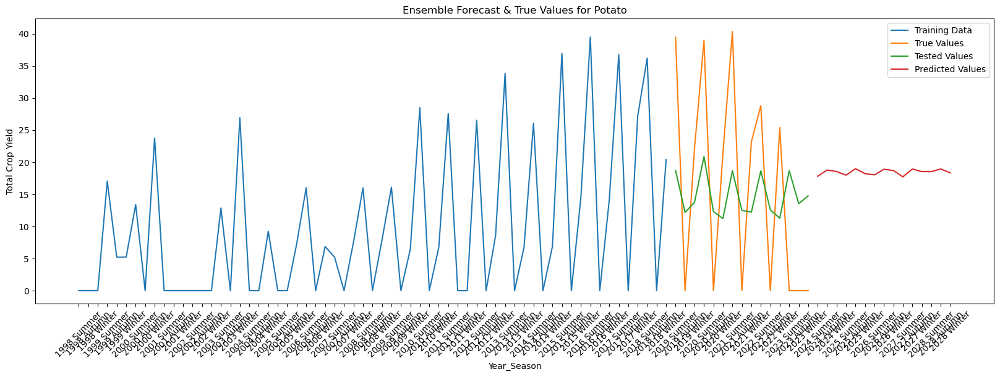

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0291
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7864 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0918 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8128 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.7025 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9459 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4340 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.8661 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0466 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.7743 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


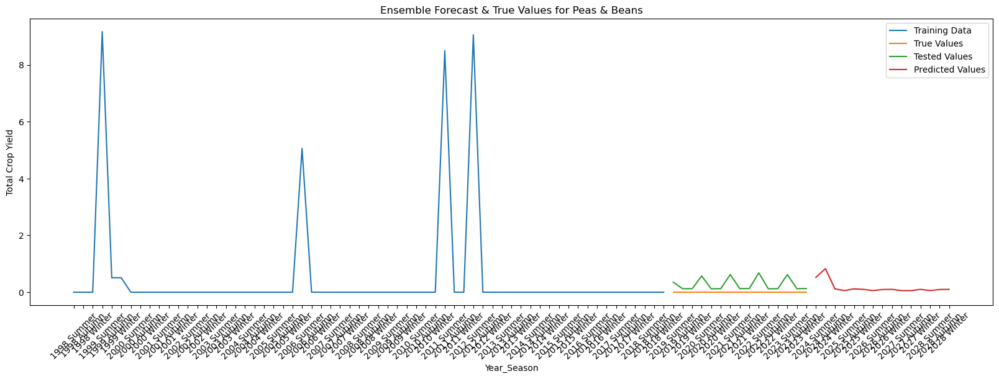

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9727  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1541 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9014 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.7115 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0037 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3113 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3903 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5732 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9119 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8942 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


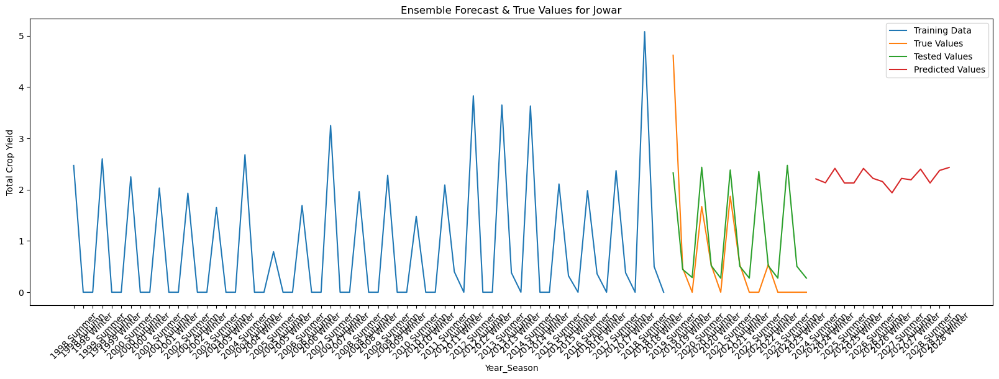

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6187  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9106 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.7875 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8457 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7467 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2475 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7445 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7982 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7383 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4421 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


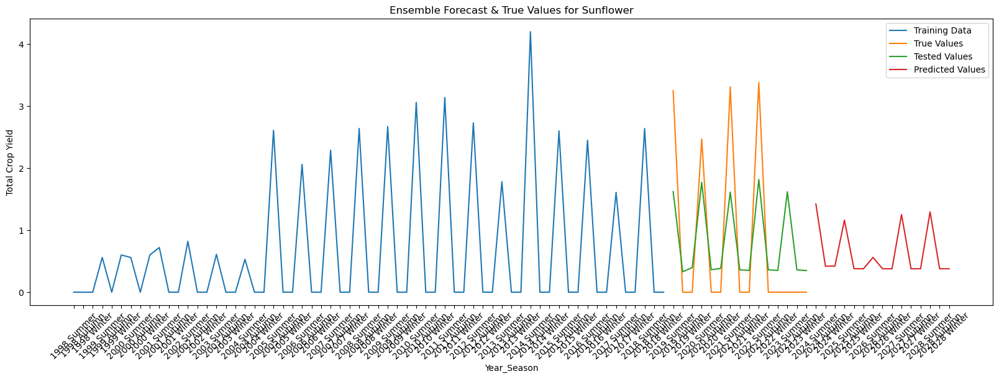

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9583.2988
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9568.7168
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9576.4541
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9545.5498
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9596.0420
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18405.3418 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9574.7119
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18491.6758 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18506.7734 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18449.4082 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


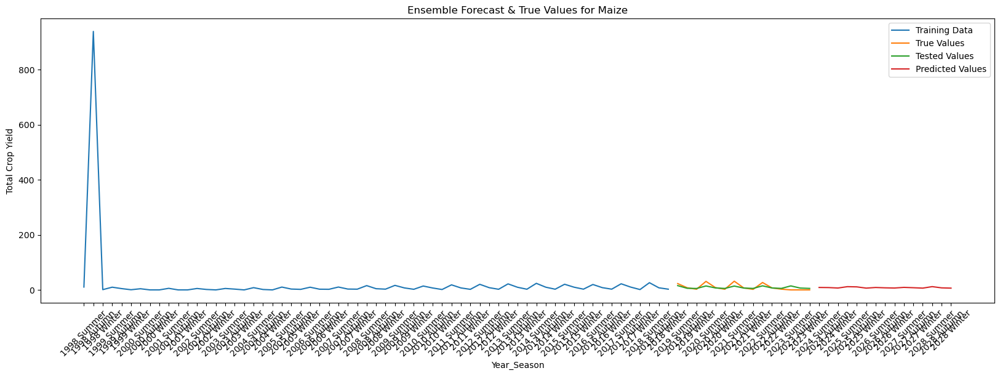

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 373.9245
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 395.8410 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 395.1109 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 355.5437 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 385.4372 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 396.4391
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 393.4622 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 370.4197
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 401.1444
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 367.5700
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


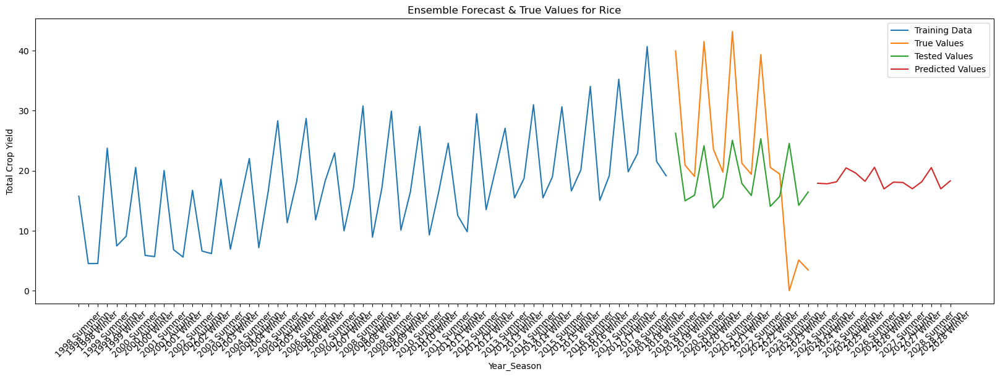

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 409.5223  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 476.1013 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 416.0323 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 411.2215 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 489.1728 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 475.7673 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 430.7450 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 466.2041 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 391.4558 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 381.9062 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


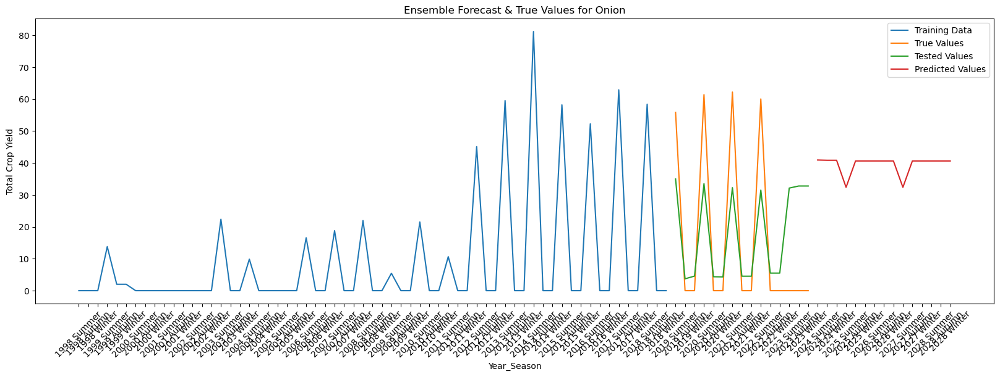

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2019  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7068 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2676 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1776 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5292
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8539
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0388
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0734 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1515 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8547 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


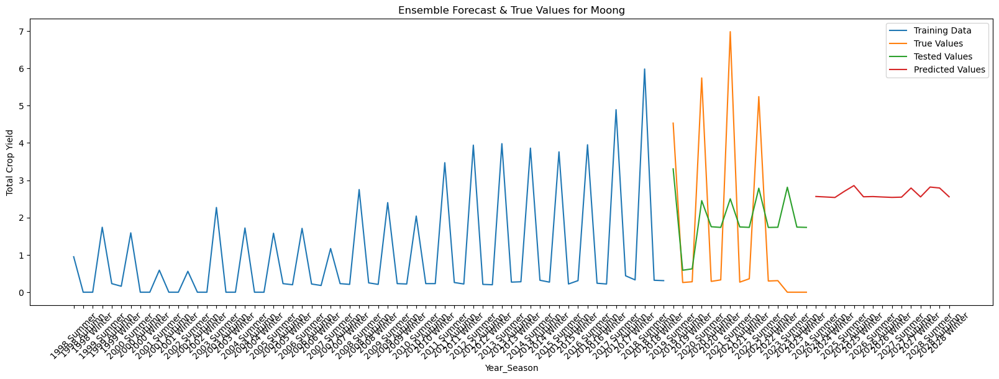

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5218  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4827 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6135 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5256 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3548
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3249 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4833 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3626 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3861 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4127 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


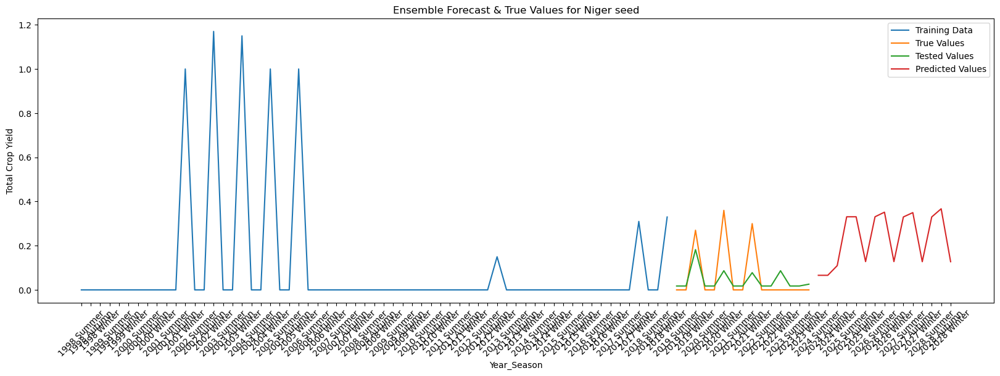

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4367  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5636 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5270 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4878 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4583
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3804
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5107
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7584
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3982 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6080
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


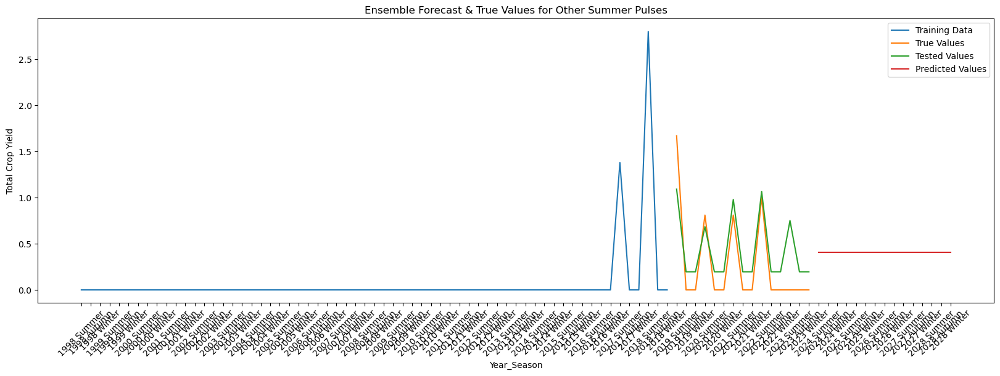

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9828
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6493 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6588 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7081 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6181 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0050 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5588 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6128 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8309
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4092
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


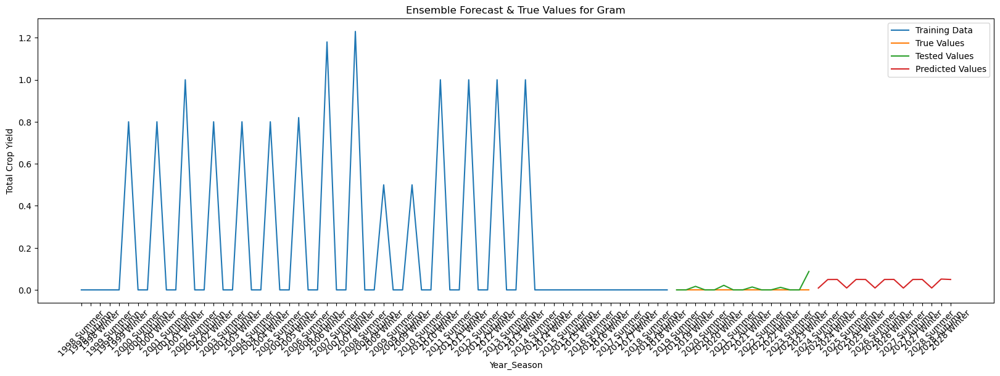

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5035  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6810 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4531
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4405
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5092 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5684
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7484 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5624 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4885 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5620 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


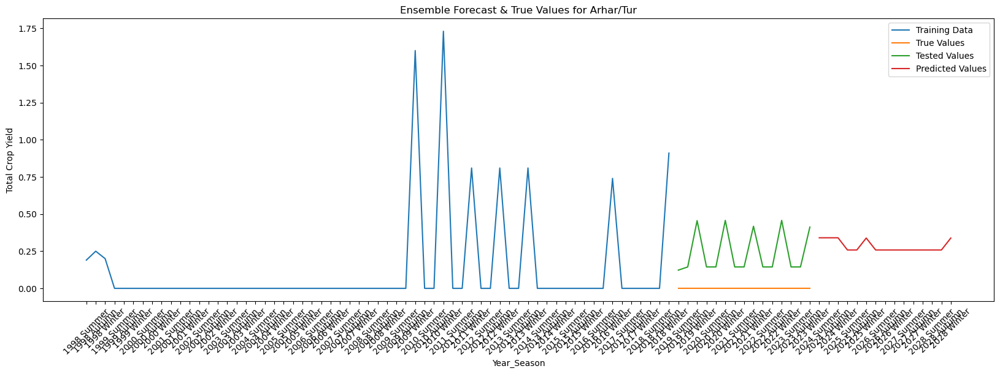

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7929
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9054 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6465
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7821
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7596
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7483
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7879 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5485
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7250
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7746
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


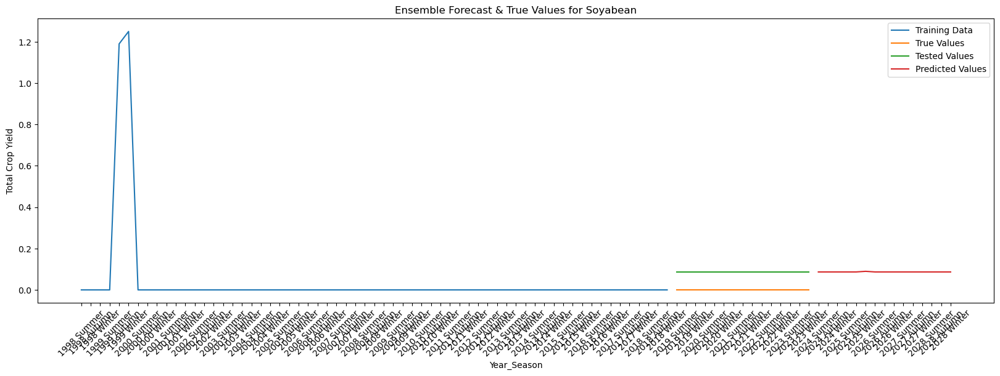

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2553  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2184
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2110
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2388
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2877 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1829 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1849 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2406 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2000 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2148 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


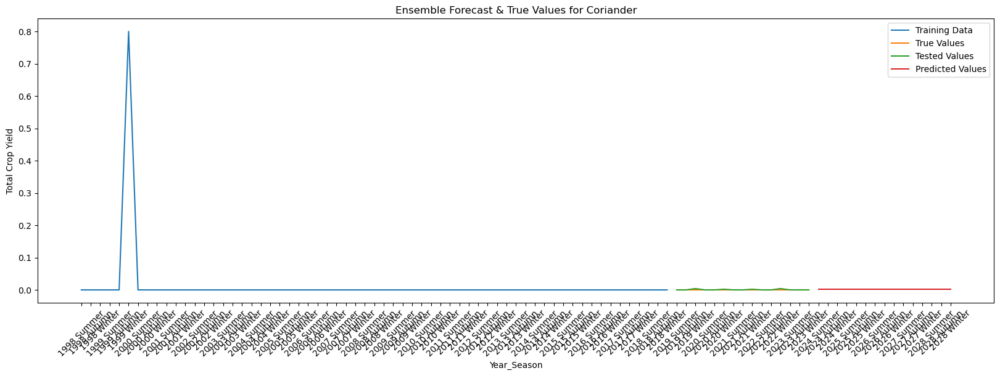

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9415  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5192
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3037
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4030
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0699
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9741
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9781
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0012
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2087
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2814
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


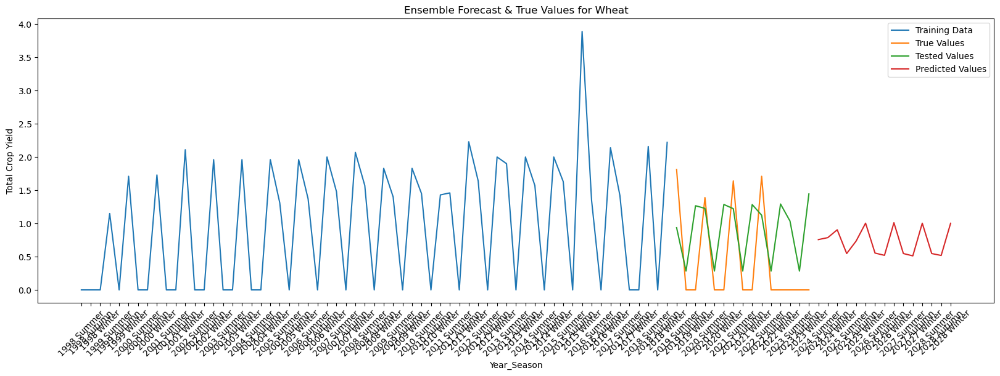

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6617
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6144 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4987
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5081
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7528
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5377
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5739
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5209
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5416 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


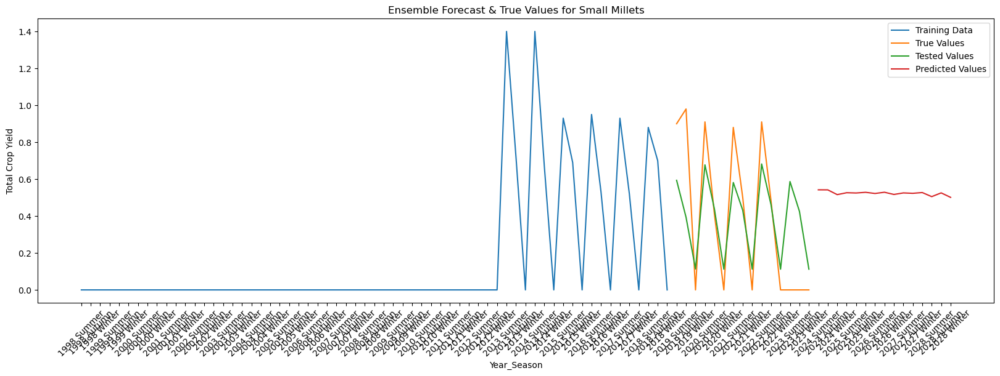

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0139  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0680
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9708
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4894
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7417
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0507 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0616
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1452
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0935
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9149
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


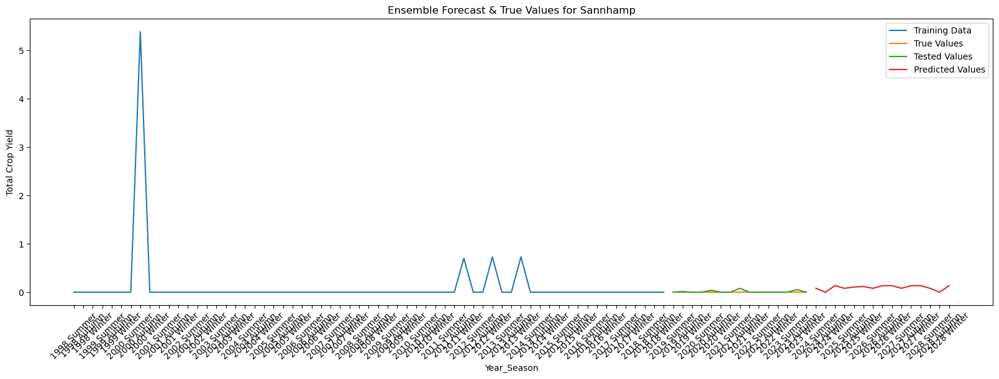

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3581
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6373 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.3623 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.5173 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8190 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1038 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6951 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8783 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6384
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


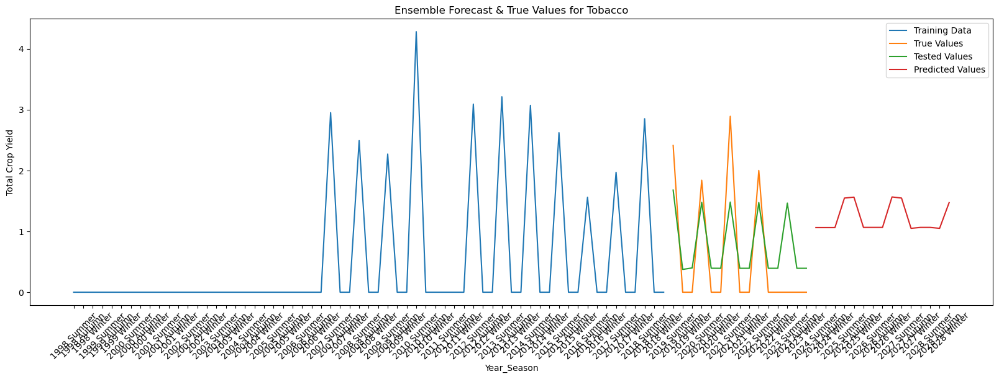

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8933  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6622
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8223 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7919 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2405 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8781 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7303 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9390 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6897 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0653 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


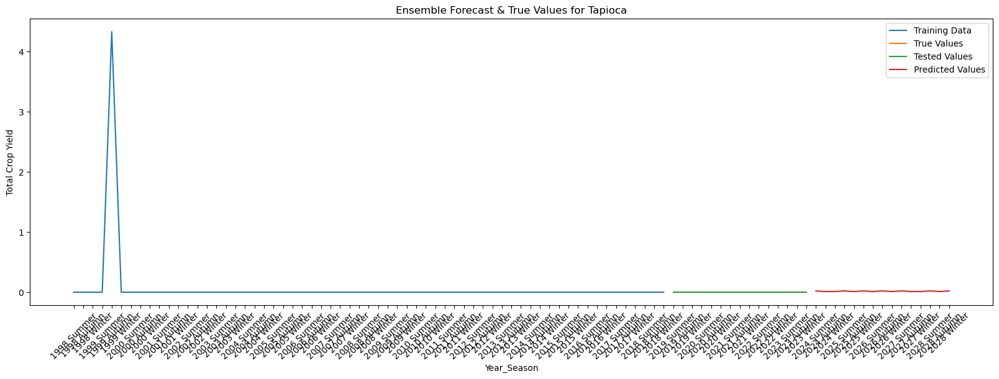

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3806  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2648 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2212 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2976 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2828 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3084 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3322 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2934 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2208 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2159 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


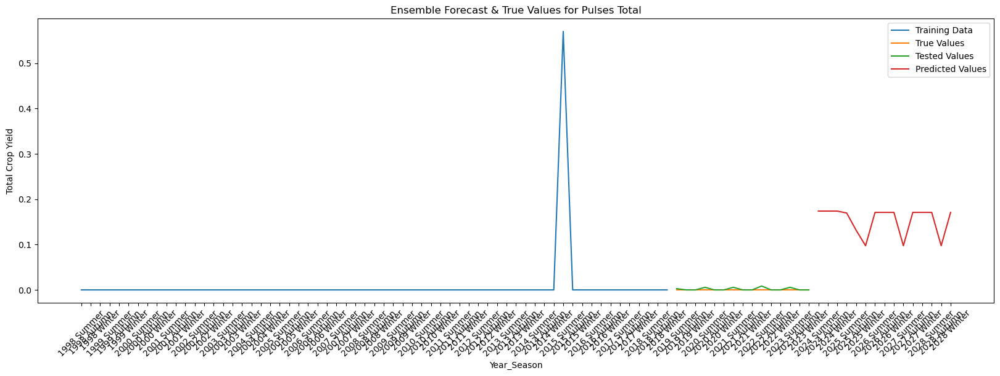

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8266
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7513 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7093 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9447 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9066 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8747 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6475 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8095 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6235 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8654 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


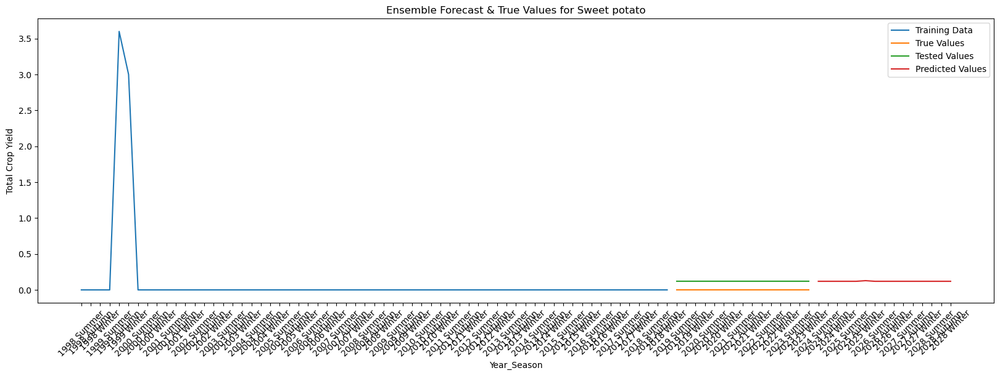

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5280  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6486 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5458 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7572 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8122 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4054 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8881 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8914 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6945 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5297 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


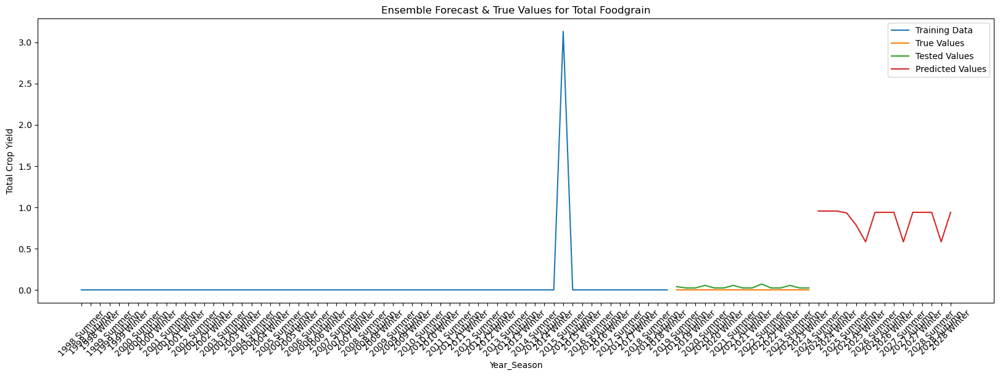

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3029  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3523 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2408 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2866 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2741 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3497 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2225 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2833 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2149 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2291 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


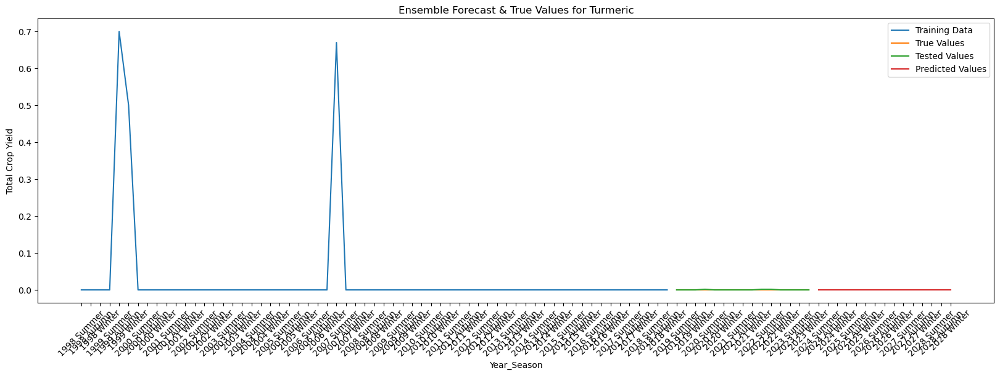

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7238  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4794 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6703 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6921 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6906 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5784 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5454 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7101
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4919
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6895 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


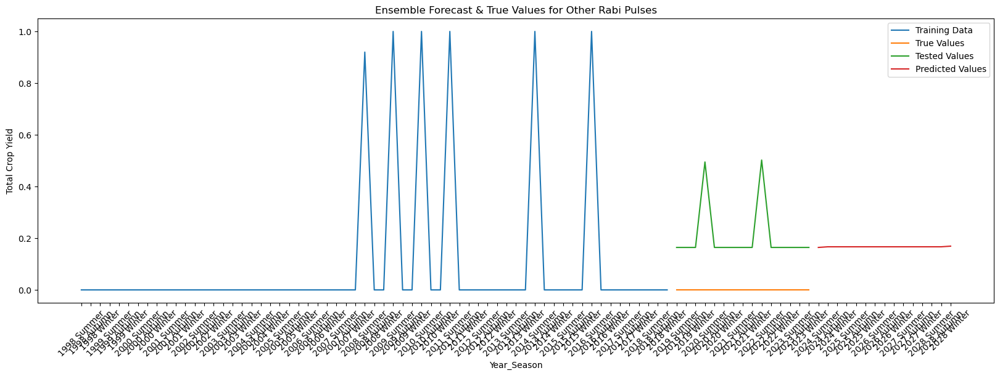

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 24.5194  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19.9996 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 26.7860 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18.7754 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.7836 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 27.8561 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19.4449 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.1833 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.8817 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 17.3989 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


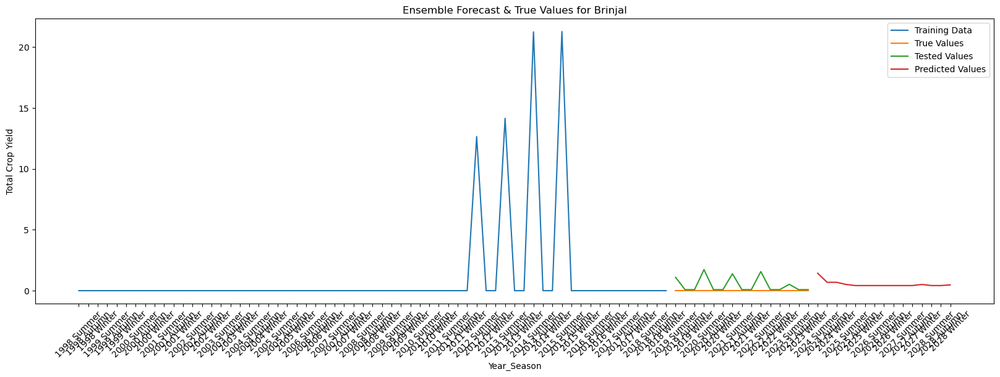

Average Ensemble RMSE: 3.126954598908009


In [7]:
df_ensemble = hist_df
df_ensemble_future = future_df

def map_season(season):
    return '1' if season == 'Summer' else ('2' if season == 'Autumn' else '3')

df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble = df_ensemble.sort_values('Year_Season')
df_ensemble.reset_index(drop=True, inplace=True)
df_ensemble_future['Year_Season'] = df_ensemble_future.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble_future = df_ensemble_future.sort_values('Year_Season')
df_ensemble_future.reset_index(drop=True, inplace=True)

agg_func = {
    'yield': 'sum', 
    'Inflation annual %': 'mean',
    'Population': 'mean',
    'temperature_2m_min': 'mean',
    'temperature_2m_max': 'mean',
    'precipitation_sum': 'mean',
    'Mean_N_SOIL': 'mean',
    'Mean_P_SOIL': 'mean',
    'Mean_K_SOIL': 'mean',
    'Mean_TEMPERATURE': 'mean',
    'Mean_HUMIDITY': 'mean'
}

agg_func_future = {
    'Inflation annual %': 'mean',
    'Population': 'mean',
    'temperature_2m_min': 'mean',
    'temperature_2m_max': 'mean',
    'precipitation_sum': 'mean',
    'Mean_N_SOIL': 'mean',
    'Mean_P_SOIL': 'mean',
    'Mean_K_SOIL': 'mean',
    'Mean_TEMPERATURE': 'mean',
    'Mean_HUMIDITY': 'mean'
}

ensemble_rmse_scores = []

for crop in df_ensemble['crop'].unique():
    df_crop = df_ensemble[df_ensemble['crop']==crop]
    df_crop.reset_index(drop=True, inplace=True)
    df_crop_future = df_ensemble_future[df_ensemble_future['crop']==crop]
    df_crop_future.reset_index(drop=True, inplace=True)
    
    df_crop_train = df_crop[df_crop['year']<=2018]
    df_crop_test = df_crop[df_crop['year']>=2019]
    df_crop_train = df_crop_train.drop(columns=['year', 'season', 'state', 'crop'])
    df_crop_test = df_crop_test.drop(columns=['year', 'season','state', 'crop'])
    df_crop_future.drop(columns=['year', 'season','state', 'crop'])
    df_crop_train = df_crop_train.groupby('Year_Season').agg(agg_func)
    df_crop_test = df_crop_test.groupby('Year_Season').agg(agg_func)
    X_future = df_crop_future.groupby('Year_Season').agg(agg_func_future)
    
    X_train = df_crop_train.drop(columns=['yield'])
    y_train = df_crop_train['yield']
    X_test = df_crop_test.drop(columns=['yield'])
    y_test = df_crop_test['yield']
    
    # Random Forest
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    rf_y_pred = rf_model.predict(X_test)
    rf_forecast = rf_model.predict(X_future)
    
    # Gradient Boosting
    gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
    gb_model.fit(X_train, y_train)
    gb_y_pred = gb_model.predict(X_test)
    gb_forecast = gb_model.predict(X_future)

    # ARIMA
    best_params = {}
    best_rmse = {}
    p_values = range(0, 2) 
    d_values = range(0, 2) 
    q_values = range(0, 2) 
    best_params[state] = (0, 1, 1)
    best_rmse[state] = float('inf')

    # Perform grid search for the current state and crop
    for p, d, q in product(p_values, d_values, q_values):
        if p == 0 and d == 0 and q == 0:
            continue

        # Train ARIMA model
        order = (p, d, q)
        model = ARIMA(y_train, order=order)
        try:
            fit_model = model.fit()
            forecast = fit_model.forecast(steps=len(y_test))
            rmse = np.sqrt(mean_squared_error(y_test, forecast))
            if rmse < best_rmse[state]:
                best_rmse[state] = rmse
                best_params[state] = order
        except:
            continue

    # Train ARIMA model with best parameters for the current state and crop
    arima_model = ARIMA(y_train, order=best_params[state])
    arima_fit_model = arima_model.fit()

    # Forecast with best model for the current state and crop
    arima_steps = arima_fit_model.forecast(steps=15+15)
    arima_y_pred = arima_steps[:15]
    arima_forecast = arima_steps[15:]
    
    # Attention and LSTM
    class Attention(tf.keras.layers.Layer):
        def __init__(self, units):
            super(Attention, self).__init__()
            self.W = tf.keras.layers.Dense(units)
            self.V = tf.keras.layers.Dense(1)

        def call(self, inputs):
            # Compute attention scores
            score = tf.nn.tanh(self.W(inputs))
            attention_weights = tf.nn.softmax(self.V(score), axis=1)

            # Apply attention weights to input
            context_vector = attention_weights * inputs
            context_vector = tf.reduce_sum(context_vector, axis=1)
            return context_vector
            
    def build_model():
        inputs = Input(shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]))
        lstm_out = LSTM(64, return_sequences=True)(inputs)
        dropout = Dropout(0.2)(lstm_out)
        batch_norm = BatchNormalization()(dropout)
        attention = Attention(64)(batch_norm)
        output = Dense(1)(attention)
        model = Model(inputs=inputs, outputs=output)
        return model
        
    # Reshape X_train for input to the model
    X_train_reshaped = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
    
    # Reshape X_future for input to the model
    X_test_reshaped = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])
    
    attention_lstm_model = build_model()
    attention_lstm_model.compile(optimizer="adam", loss="mse")
    attention_lstm_model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32)

    # Predict using the model
    attention_lstm_y_pred = attention_lstm_model.predict(X_test_reshaped)
    attention_lstm_y_pred = [item[0] for item in attention_lstm_y_pred]
    attention_lstm_y_pred = [max(value, 0) for value in attention_lstm_y_pred] 
    
    # Reshape X_future for input to the model
    X_future_reshaped = X_future.values.reshape(X_future.shape[0], 1, X_future.shape[1])

    # Predict using the model
    attention_lstm_forecast = attention_lstm_model.predict(X_future_reshaped)
    attention_lstm_forecast = [item[0] for item in attention_lstm_forecast]
    attention_lstm_forecast = [max(value, 0) for value in attention_lstm_forecast] 
    
    ensemble_y_pred = np.mean([rf_y_pred, gb_y_pred, arima_y_pred, attention_lstm_y_pred], axis=0)
    ensemble_rmse = np.sqrt(mean_squared_error(y_test, ensemble_y_pred))
    ensemble_rmse_scores.append(ensemble_rmse)
    
    forecast = np.mean([rf_forecast, gb_forecast, arima_forecast, attention_lstm_forecast], axis=0)
    
    # Plotting the results for the current crop
    plt.figure(figsize=(20, 6))
    plt.plot(list(range(1, 64)), y_train, label='Training Data')
    plt.plot(list(range(64, 79)), y_test, label='True Values')
    plt.plot(list(range(64, 79)), ensemble_y_pred, label='Tested Values')
    plt.plot(list(range(79, 94)), forecast, label='Predicted Values')
    plt.xlabel('Year_Season')
    plt.ylabel('Total Crop Yield')
    plt.title(f'Ensemble Forecast & True Values for {crop}')
    seasons = ['Summer', 'Autumn', 'Winter']
    years = range(1998, 2029)
    custom_labels = [f"{year} {season}" for year in years for season in seasons]
    plt.xticks(range(1, 94), custom_labels, rotation=45)
    plt.legend()
    plt.show()

avg_ensemble_rmse = np.mean(ensemble_rmse_scores)
print("Average Ensemble RMSE:", avg_ensemble_rmse)